# R EDA - discriptive statistics and correletions_Sh_BGP_onehot_log_24052022

In [7]:
#library(dplyr)
#library(dbplyr)
#library(tidyverse)
#library(DBI)
#library(odbc)

# A.
### up loading the FF from SQL to data frame : df

In [264]:

conn <- DBI::dbConnect(
  odbc::odbc(),
  Driver = "SQL Server",
  Server = "SHEM\\SQLEXPRESS",
  Database = "A_BDG"
)




In [265]:
df <- dbGetQuery(conn, "SELECT * FROM Sh.BGP_FF_OC")

In [11]:
# Data from Kaggle: https://www.kaggle.com/jsphyg/weather-dataset-rattle-package
#df <- read.csv("C:\\Users\\SG\\0DS13\\DSprocedure\\Shem_Box_Office\\Shem_BoxOffice_Final_FF.csv")

In [259]:
#df$release_date=as.Date(df$release_date)

In [266]:
head(df)

,BIDm,SIDn,PrUs,SbPrUs,sqm,lat,lng,Tmz,El_Max_W1,El_Max_W2,...,Std_windDirection_W2,Std_windDirection_W3,Std_windDirection_W4,Std_windDirection_W5,Std_windSpeed_W1,Std_windSpeed_W2,Std_windSpeed_W3,Std_windSpeed_W4,Std_windSpeed_W5,El_Nxt_Mnth_Avg_OC
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Apr_Bobcat_assembly_Adam,Bobcat,Entertainment/public assembly,Sports Facility,2053.2,NA,NA,US/Mountain,147.25,129.13,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,56.82697
2,Apr_Bobcat_assembly_Billy,Bobcat,Entertainment/public assembly,Sports Facility,19859.1,NA,NA,US/Mountain,225.00,202.00,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,108.60993
3,Apr_Bobcat_assembly_Camilla,Bobcat,Entertainment/public assembly,Sports Facility,3696.4,NA,NA,US/Mountain,30.62,34.63,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,20.52453
4,Apr_Bobcat_assembly_Franklin,Bobcat,Entertainment/public assembly,Sports Facility,15047.4,NA,NA,US/Mountain,178.50,180.00,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,191.52966
5,Apr_Bobcat_education_Alissa,Bobcat,Education,Academic,11254.8,NA,NA,US/Mountain,95.50,103.25,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,56.17005
6,Apr_Bobcat_education_Angela,Bobcat,Education,Academic,8802.7,NA,NA,US/Mountain,145.62,139.12,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,70.38614


### A.1.  Descriptive Statistics

In [267]:
summary(df)

     BIDm               SIDn               PrUs              SbPrUs         
 Length:10272       Length:10272       Length:10272       Length:10272      
 Class :character   Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character  
                                                                            
                                                                            
                                                                            
                                                                            
      sqm               lat             lng              Tmz           
 Min.   :   26.3   Min.   :28.52   Min.   :-111.93   Length:10272      
 1st Qu.: 3446.6   1st Qu.:30.27   1st Qu.: -97.74   Class :character  
 Median : 6929.8   Median :33.42   Median : -93.26   Mode  :character  
 Mean   :10196.6   Mean   :36.92   Mean   : -91.46                     
 3rd Qu.:13020.9   3rd Q

### A.2 Strings to factors

In [268]:
### creating a name list of the features separating chars (strlst) features from numeric ones (numlst)
strlst <- NULL
numlst <- NULL
for (v in names(df)) {
    if(typeof(df[[v]])=='character' | is.factor(df[[v]])) {
        strlst <- c(strlst,v) 
    } else {
        numlst <- c(numlst, v)
    }
}
strlst
numlst

[1] "BIDm"   "SIDn"   "PrUs"   "SbPrUs" "Tmz"

[1] "sqm"                   "lat"                   "lng"                  
  [4] "El_Max_W1"             "El_Max_W2"             "El_Max_W3"            
  [7] "El_Max_W4"             "El_Max_W5"             "El_Min_W1"            
 [10] "El_Min_W2"             "El_Min_W3"             "El_Min_W4"            
 [13] "El_Min_W5"             "El_AVG_W1"             "El_AVG_W2"            
 [16] "El_AVG_W3"             "El_AVG_W4"             "El_AVG_W5"            
 [19] "El_STD_W1"             "El_STD_W2"             "El_STD_W3"            
 [22] "El_STD_W4"             "El_STD_W5"             "ChWt_Max_W1"          
 [25] "ChWt_Max_W2"           "ChWt_Max_W3"           "ChWt_Max_W4"          
 [28] "ChWt_Max_W5"           "ChWt_Min_W1"           "ChWt_Min_W2"          
 [31] "ChWt_Min_W3"           "ChWt_Min_W4"           "ChWt_Min_W5"          
 [34] "ChWt_AVG_W1"           "ChWt_AVG_W2"           "ChWt_AVG_W3"          
 [37] "ChWt_AVG_W4"           "ChWt_AVG_W5"           "ChWt_STD_W1"          
 [40] "ChWt_STD_W2"           "ChWt_STD_W3"           "ChWt_STD_W4"          
 [43] "ChWt_STD_W5"           "gas_Max_W1"            "gas_Max_W2"           
 [46] "gas_Max_W3"            "gas_Max_W4"            "gas_Max_W5"           
 [49] "gas_Min_W1"            "gas_Min_W2"            "gas_Min_W3"           
 [52] "gas_Min_W4"            "gas_Min_W5"            "gas_AVG_W1"           
 [55] "gas_AVG_W2"            "gas_AVG_W3"            "gas_AVG_W4"           
 [58] "gas_AVG_W5"            "gas_STD_W1"            "gas_STD_W2"           
 [61] "gas_STD_W3"            "gas_STD_W4"            "gas_STD_W5"           
 [64] "hotwater_Max_W1"       "hotwater_Max_W2"       "hotwater_Max_W3"      
 [67] "hotwater_Max_W4"       "hotwater_Max_W5"       "hotwater_Min_W1"      
 [70] "hotwater_Min_W2"       "hotwater_Min_W3"       "hotwater_Min_W4"      
 [73] "hotwater_Min_W5"       "hotwater_AVG_W1"       "hotwater_AVG_W2"      
 [76] "hotwater_AVG_W3"       "hotwater_AVG_W4"       "hotwater_AVG_W5"      
 [79] "hotwater_STD_W1"       "hotwater_STD_W2"       "hotwater_STD_W3"      
 [82] "hotwater_STD_W4"       "hotwater_STD_W5"       "Stm_Max_W1"           
 [85] "Stm_Max_W2"            "Stm_Max_W3"            "Stm_Max_W4"           
 [88] "Stm_Max_W5"            "Stm_Min_W1"            "Stm_Min_W2"           
 [91] "Stm_Min_W3"            "Stm_Min_W4"            "Stm_Min_W5"           
 [94] "Stm_AVG_W1"            "Stm_AVG_W2"            "Stm_AVG_W3"           
 [97] "Stm_AVG_W4"            "Stm_AVG_W5"            "Stm_STD_W1"           
[100] "Stm_STD_W2"            "Stm_STD_W3"            "Stm_STD_W4"           
[103] "Stm_STD_W5"            "MAX_airTemperature_W1" "MAX_airTemperature_W2"
[106] "MAX_airTemperature_W3" "MAX_airTemperature_W4" "MAX_airTemperature_W5"
[109] "MAX_dewTemperature_W1" "MAX_dewTemperature_W2" "MAX_dewTemperature_W3"
[112] "MAX_dewTemperature_W4" "MAX_dewTemperature_W5" "MAX_seaLvlPressure_W1"
[115] "MAX_seaLvlPressure_W2" "MAX_seaLvlPressure_W3" "MAX_seaLvlPressure_W4"
[118] "MAX_seaLvlPressure_W5" "MAX_windDirection_W1"  "MAX_windDirection_W2" 
[121] "MAX_windDirection_W3"  "MAX_windDirection_W4"  "MAX_windDirection_W5" 
[124] "MAX_windSpeed_W1"      "MAX_windSpeed_W2"      "MAX_windSpeed_W3"     
[127] "MAX_windSpeed_W4"      "MAX_windSpeed_W5"      "Min_airTemperature_W1"
[130] "Min_airTemperature_W2" "Min_airTemperature_W3" "Min_airTemperature_W4"
[133] "Min_airTemperature_W5" "Min_dewTemperature_W1" "Min_dewTemperature_W2"
[136] "Min_dewTemperature_W3" "Min_dewTemperature_W4" "Min_dewTemperature_W5"
[139] "Min_seaLvlPressure_W1" "Min_seaLvlPressure_W2" "Min_seaLvlPressure_W3"
[142] "Min_seaLvlPressure_W4" "Min_seaLvlPressure_W5" "Min_windDirection_W1" 
[145] "Min_windDirection_W2"  "Min_windDirection_W3"  "Min_windDirection_W4" 
[148] "Min_windDirection_W5"  "Min_windSpeed_W1"      "Min_windSpeed_W2"     
[151] "Min_windSpeed_W3"      "Min_windSpeed_W4"      "Min_windSpeed_W5"     
[154] "Avg_airTemperatur

In [269]:
length(numlst)

[1] 204

In [270]:
summary(df)

     BIDm               SIDn               PrUs              SbPrUs         
 Length:10272       Length:10272       Length:10272       Length:10272      
 Class :character   Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character  
                                                                            
                                                                            
                                                                            
                                                                            
      sqm               lat             lng              Tmz           
 Min.   :   26.3   Min.   :28.52   Min.   :-111.93   Length:10272      
 1st Qu.: 3446.6   1st Qu.:30.27   1st Qu.: -97.74   Class :character  
 Median : 6929.8   Median :33.42   Median : -93.26   Mode  :character  
 Mean   :10196.6   Mean   :36.92   Mean   : -91.46                     
 3rd Qu.:13020.9   3rd Q

####  Change char featuers to factor

In [271]:
for (v in strlst) {
    if(typeof(df[[v]])=='character') {
        df[[v]] <- factor(df[[v]])
    }
}

In [272]:
summary(df)

                           BIDm             SIDn     
 Apr_Bobcat_assembly_Adam    :    1   Hog     :1824  
 Apr_Bobcat_assembly_Billy   :    1   Fox     :1644  
 Apr_Bobcat_assembly_Camilla :    1   Bull    :1476  
 Apr_Bobcat_assembly_Franklin:    1   Cockatoo:1404  
 Apr_Bobcat_education_Alissa :    1   Eagle   :1272  
 Apr_Bobcat_education_Angela :    1   Panther :1260  
 (Other)                     :10266   (Other) :1392  
                            PrUs                     SbPrUs    
 Education                    :3600   Office            :2532  
 Office                       :2544   College Classroom :1296  
 Lodging/residential          :1452   College Laboratory:1164  
 Entertainment/public assembly:1068   Dormitory         : 960  
 Public services              : 348   Research          : 348  
 (Other)                      :1032   (Other)           :3744  
 NA's                         : 228   NA's              : 228  
      sqm               lat             lng             

In [144]:
write.csv(summary(df), file="BGP_sum1_20052022.csv")

In [273]:
df_indx <- cbind(ID = 1:nrow(df), df)  # creating an index column for easy use without BIDm

In [274]:
df_indx

ID,BIDm,SIDn,PrUs,SbPrUs,sqm,lat,lng,Tmz,El_Max_W1,...,Std_windDirection_W2,Std_windDirection_W3,Std_windDirection_W4,Std_windDirection_W5,Std_windSpeed_W1,Std_windSpeed_W2,Std_windSpeed_W3,Std_windSpeed_W4,Std_windSpeed_W5,El_Nxt_Mnth_Avg_OC
<int>,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Apr_Bobcat_assembly_Adam,Bobcat,Entertainment/public assembly,Sports Facility,2053.2,NA,NA,US/Mountain,147.2500,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,56.826975
2,Apr_Bobcat_assembly_Billy,Bobcat,Entertainment/public assembly,Sports Facility,19859.1,NA,NA,US/Mountain,225.0000,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,108.609934
3,Apr_Bobcat_assembly_Camilla,Bobcat,Entertainment/public assembly,Sports Facility,3696.4,NA,NA,US/Mountain,30.6200,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,20.524533
4,Apr_Bobcat_assembly_Franklin,Bobcat,Entertainment/public assembly,Sports Facility,15047.4,NA,NA,US/Mountain,178.5000,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,191.529662
5,Apr_Bobcat_education_Alissa,Bobcat,Education,Academic,11254.8,NA,NA,US/Mountain,95.5000,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,56.170051
6,Apr_Bobcat_education_Angela,Bobcat,Education,Academic,8802.7,NA,NA,US/Mountain,145.6200,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,70.386137
7,Apr_Bobcat_education_Barbra,Bobcat,Education,Academic,2538.0,NA,NA,US/Mountain,NA,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,NA
8,Apr_Bobcat_education_Coleman,Bobcat,Education,Academic,10551.9,NA,NA,US/Mountain,203.0000,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,132.154969
9,Apr_Bobcat_education_Dylan,Bobcat,Education,Student Center,17358.0,NA,NA,US/Mountain,227.2500,...,94.71668,119.4723,100.0055,125.112,1.625675,1.793841,2.202108,2.633764,2.440854,119.879087


### A.3 Using Mechkar for rigorouse statisics.

In [145]:
source("mechkar.r")

In [146]:
tab1 <- Table1(data=df[,1:ncol(df)],y="El_Nxt_Mnth_Avg_OC")  

  |======================================================================| 100%

The dependent variable has more than 8 levels, table too large!



In [340]:
tab1_log <- Table1(data=df_temp3_log[,1:ncol(df_temp3_log)],y="El_Nxt_Mnth_Avg_OC")  

  |======================================================================| 100%

The dependent variable has more than 8 levels, table too large!



In [147]:
tab2 <- Table1(data=df[,1:ncol(df)-1],y="El_Nxt_Mnth_Avg_OC")  

  |======================================================================| 100%

In [346]:
tab2

Variables,,p-value
<chr>,<chr>,<chr>
Variables,Categories,Population
Individuals,n,10272
BIDm,Apr_Bobcat_assembly_Adam,1 (0.0%)
BIDm,Apr_Bobcat_assembly_Billy,1 (0.0%)
BIDm,Apr_Bobcat_assembly_Camilla,1 (0.0%)
BIDm,Apr_Bobcat_assembly_Franklin,1 (0.0%)
BIDm,Apr_Bobcat_education_Alissa,1 (0.0%)
BIDm,Apr_Bobcat_education_Angela,1 (0.0%)
BIDm,Apr_Bobcat_education_Barbra,1 (0.0%)


In [149]:
write.csv(tab2, file="BGP_sum1_20052022_mechkar20052022.csv")

In [150]:
tab1

Variables,,p-value
<chr>,<chr>,<chr>
Variables,Categories,Population
Individuals,n,10272
BIDm,Apr_Bobcat_assembly_Adam,1 (0.0%)
BIDm,Apr_Bobcat_assembly_Billy,1 (0.0%)
BIDm,Apr_Bobcat_assembly_Camilla,1 (0.0%)
BIDm,Apr_Bobcat_assembly_Franklin,1 (0.0%)
BIDm,Apr_Bobcat_education_Alissa,1 (0.0%)
BIDm,Apr_Bobcat_education_Angela,1 (0.0%)
BIDm,Apr_Bobcat_education_Barbra,1 (0.0%)


In [335]:
summary (tab1)

  Variables                              p-value         
 Length:10982       Length:10982       Length:10982      
 Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character  

In [336]:
summary (tab2)

  Variables                              p-value         
 Length:10979       Length:10979       Length:10979      
 Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character  

In [347]:
tab1[tab1$Variables == "El_Nxt_Mnth_Avg_OC",]

,Variables,,p-value
,<chr>,<chr>,<chr>
10980,El_Nxt_Mnth_Avg_OC,Mean (SD),178.1 (280.8)
10981,El_Nxt_Mnth_Avg_OC,Median (IQR),88.7 (37.7-193.0)
10982,El_Nxt_Mnth_Avg_OC,Missing (%),964 (9.4%)


In [350]:
tab1[is.na(tab1$'p-value')==F,]

,Variables,,p-value
,<chr>,<chr>,<chr>
1,Variables,Categories,Population
2,Individuals,n,10272
3,BIDm,Apr_Bobcat_assembly_Adam,1 (0.0%)
4,BIDm,Apr_Bobcat_assembly_Billy,1 (0.0%)
5,BIDm,Apr_Bobcat_assembly_Camilla,1 (0.0%)
6,BIDm,Apr_Bobcat_assembly_Franklin,1 (0.0%)
7,BIDm,Apr_Bobcat_education_Alissa,1 (0.0%)
8,BIDm,Apr_Bobcat_education_Angela,1 (0.0%)
9,BIDm,Apr_Bobcat_education_Barbra,1 (0.0%)


In [351]:
tab1_log[is.na(tab1_log$'p-value')==F,]

,Variables,,p-value
,<chr>,<chr>,<chr>
1,Variables,Categories,Population
2,Individuals,n,10272
3,ID,Mean (SD),"5,136.5 (2,965.4)"
4,ID,Median (IQR),"5,136.5 (2,568.8-7,704.2)"
5,ID,Missing (%),--
6,sqm,Mean (SD),"10,196.7 (10,772.2)"
7,sqm,Median (IQR),"6,929.8 (3,446.6-13,020.9)"
8,sqm,Missing (%),--
9,lat,Mean (SD),36.9 (6.5)


In [154]:
write.csv(tab1[is.na(tab1$'p-value')==F,], file="BGP_nas_mechkar20052022.csv")

In [352]:
write.csv(tab1_log[is.na(tab1_log$'p-value')==F,], file="BGP_nas_mechkar_log_24052022.csv")

In [155]:
nm <- names(df)
nm

[1] "BIDm"                  "SIDn"                  "PrUs"                 
  [4] "SbPrUs"                "sqm"                   "lat"                  
  [7] "lng"                   "Tmz"                   "El_Max_W1"            
 [10] "El_Max_W2"             "El_Max_W3"             "El_Max_W4"            
 [13] "El_Max_W5"             "El_Min_W1"             "El_Min_W2"            
 [16] "El_Min_W3"             "El_Min_W4"             "El_Min_W5"            
 [19] "El_AVG_W1"             "El_AVG_W2"             "El_AVG_W3"            
 [22] "El_AVG_W4"             "El_AVG_W5"             "El_STD_W1"            
 [25] "El_STD_W2"             "El_STD_W3"             "El_STD_W4"            
 [28] "El_STD_W5"             "ChWt_Max_W1"           "ChWt_Max_W2"          
 [31] "ChWt_Max_W3"           "ChWt_Max_W4"           "ChWt_Max_W5"          
 [34] "ChWt_Min_W1"           "ChWt_Min_W2"           "ChWt_Min_W3"          
 [37] "ChWt_Min_W4"           "ChWt_Min_W5"           "ChWt_AVG_W1"          
 [40] "ChWt_AVG_W2"           "ChWt_AVG_W3"           "ChWt_AVG_W4"          
 [43] "ChWt_AVG_W5"           "ChWt_STD_W1"           "ChWt_STD_W2"          
 [46] "ChWt_STD_W3"           "ChWt_STD_W4"           "ChWt_STD_W5"          
 [49] "gas_Max_W1"            "gas_Max_W2"            "gas_Max_W3"           
 [52] "gas_Max_W4"            "gas_Max_W5"            "gas_Min_W1"           
 [55] "gas_Min_W2"            "gas_Min_W3"            "gas_Min_W4"           
 [58] "gas_Min_W5"            "gas_AVG_W1"            "gas_AVG_W2"           
 [61] "gas_AVG_W3"            "gas_AVG_W4"            "gas_AVG_W5"           
 [64] "gas_STD_W1"            "gas_STD_W2"            "gas_STD_W3"           
 [67] "gas_STD_W4"            "gas_STD_W5"            "hotwater_Max_W1"      
 [70] "hotwater_Max_W2"       "hotwater_Max_W3"       "hotwater_Max_W4"      
 [73] "hotwater_Max_W5"       "hotwater_Min_W1"       "hotwater_Min_W2"      
 [76] "hotwater_Min_W3"       "hotwater_Min_W4"       "hotwater_Min_W5"      
 [79] "hotwater_AVG_W1"       "hotwater_AVG_W2"       "hotwater_AVG_W3"      
 [82] "hotwater_AVG_W4"       "hotwater_AVG_W5"       "hotwater_STD_W1"      
 [85] "hotwater_STD_W2"       "hotwater_STD_W3"       "hotwater_STD_W4"      
 [88] "hotwater_STD_W5"       "Stm_Max_W1"            "Stm_Max_W2"           
 [91] "Stm_Max_W3"            "Stm_Max_W4"            "Stm_Max_W5"           
 [94] "Stm_Min_W1"            "Stm_Min_W2"            "Stm_Min_W3"           
 [97] "Stm_Min_W4"            "Stm_Min_W5"            "Stm_AVG_W1"           
[100] "Stm_AVG_W2"            "Stm_AVG_W3"            "Stm_AVG_W4"           
[103] "Stm_AVG_W5"            "Stm_STD_W1"            "Stm_STD_W2"           
[106] "Stm_STD_W3"            "Stm_STD_W4"            "Stm_STD_W5"           
[109] "MAX_airTemperature_W1" "MAX_airTemperature_W2" "MAX_airTemperature_W3"
[112] "MAX_airTemperature_W4" "MAX_airTemperature_W5" "MAX_dewTemperature_W1"
[115] "MAX_dewTemperature_W2" "MAX_dewTemperature_W3" "MAX_dewTemperature_W4"
[118] "MAX_dewTemperature_W5" "MAX_seaLvlPressure_W1" "MAX_seaLvlPressure_W2"
[121] "MAX_seaLvlPressure_W3" "MAX_seaLvlPressure_W4" "MAX_seaLvlPressure_W5"
[124] "MAX_windDirection_W1"  "MAX_windDirection_W2"  "MAX_windDirection_W3" 
[127] "MAX_windDirection_W4"  "MAX_windDirection_W5"  "MAX_windSpeed_W1"     
[130] "MAX_windSpeed_W2"      "MAX_windSpeed_W3"      "MAX_windSpeed_W4"     
[133] "MAX_windSpeed_W5"      "Min_airTemperature_W1" "Min_airTemperature_W2"
[136] "Min_airTemperature_W3" "Min_airTemperature_W4" "Min_airTemperature_W5"
[139] "Min_dewTemperature_W1" "Min_dewTemperature_W2" "Min_dewTemperature_W3"
[142] "Min_dewTemperature_W4" "Min_dewTemperature_W5" "Min_seaLvlPressure_W1"
[145] "Min_seaLvlPressure_W2" "Min_seaLvlPressure_W3" "Min_seaLvlPressure_W4"
[148] "Min_seaLvlPressure_W5" "Min_windDirection_W1"  "Min_windDirection_W2" 
[151] "Min_windDirection_W3"  "Min_windDirection_W4"  "Min_windDirection_W5" 
[154] "Min_windSpeed_W1"

In [156]:
length(nm)

[1] 209

In [356]:
for (n in nm [1:length(nm)-1])
    {
        print(n)
        print(tab1[tab1$Variables == n,])
    }

[1] "BIDm"
      Variables                                    p-value
3          BIDm          Apr_Bobcat_assembly_Adam 1 (0.0%)
4          BIDm         Apr_Bobcat_assembly_Billy 1 (0.0%)
5          BIDm       Apr_Bobcat_assembly_Camilla 1 (0.0%)
6          BIDm      Apr_Bobcat_assembly_Franklin 1 (0.0%)
7          BIDm       Apr_Bobcat_education_Alissa 1 (0.0%)
8          BIDm       Apr_Bobcat_education_Angela 1 (0.0%)
9          BIDm       Apr_Bobcat_education_Barbra 1 (0.0%)
10         BIDm      Apr_Bobcat_education_Coleman 1 (0.0%)
11         BIDm        Apr_Bobcat_education_Dylan 1 (0.0%)
12         BIDm        Apr_Bobcat_education_Emile 1 (0.0%)
13         BIDm       Apr_Bobcat_education_Hollis 1 (0.0%)
14         BIDm        Apr_Bobcat_education_Jayne 1 (0.0%)
15         BIDm        Apr_Bobcat_education_Karin 1 (0.0%)
16         BIDm      Apr_Bobcat_education_Marisha 1 (0.0%)
17         BIDm         Apr_Bobcat_education_Miki 1 (0.0%)
18         BIDm        Apr_Bobcat_education_M

In [154]:
write.csv(tab1[is.na(tab1$'p-value')==F,], file="BGP_nas_mechkar20052022.csv")

In [158]:
#install.packages('dlookr')   # הצעה של נופר

In [358]:
#library(dlookr)

In [158]:
df_num_diag <- diagnose_numeric(df)
df_num_diag

variables,min,Q1,mean,median,Q3,max,zero,minus,outlier
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
sqm,26.30000,3446.600000,10196.65199,6929.80000,13020.87500,80038.2000,0,0,624
lat,28.51769,30.267200,36.92125,33.42443,42.45984,45.4215,0,0,0
lng,-111.92814,-97.743100,-91.46198,-93.25540,-76.48529,-74.7000,0,8364,0
El_Max_W1,0.00280,60.172750,277.42104,137.53825,283.25000,44336.4610,0,0,842
El_Max_W2,0.02000,61.000000,276.31921,140.78400,288.00000,19511.0000,0,0,833
El_Max_W3,0.02000,60.491700,267.49401,138.65100,281.20000,31921.0000,0,0,809
El_Max_W4,0.02000,61.000000,300.22076,139.77000,284.00000,79769.0000,0,0,828
El_Max_W5,0.00280,60.510850,284.06541,138.43330,283.58750,44336.4610,0,0,842
El_Min_W1,0.00280,20.500000,125.73000,54.60525,136.48625,3062.0000,0,0,948


In [159]:
df_diag <- diagnose(df)
df_diag

variables,types,missing_count,missing_percent,unique_count,unique_rate
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>
BIDm,factor,0,0.000000,10272,1.0000000000
SIDn,factor,0,0.000000,11,0.0010708723
PrUs,factor,228,2.219626,17,0.0016549844
SbPrUs,factor,228,2.219626,66,0.0064252336
sqm,numeric,0,0.000000,832,0.0809968847
lat,numeric,1908,18.574766,9,0.0008761682
lng,numeric,1908,18.574766,9,0.0008761682
Tmz,factor,0,0.000000,4,0.0003894081
El_Max_W1,numeric,1164,11.331776,7453,0.7255646417


In [160]:
write.csv(df_num_diag, file="BGP-numeric_diag2-20052022.csv")

### A.4. Distribution of variables and Relationship with the outcome

In [30]:
#install.packages("mechkar")

In [161]:
exploreData(data=df, y="El_Nxt_Mnth_Avg_OC")

  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1386 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1401 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1420 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1386 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1264 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4543 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4545 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4597 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4591 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8482 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6682 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6681 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6675 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"at  -0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"radius  0.5625"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"all data on boundary of neighborhood. make span bigger"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"zero-width neighborhood. make span bigger"
Warning message:
"Computation f

  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |======================================================================| 100%

In [162]:
exploreData(data=df, y="El_Nxt_Mnth_Avg_OC", dir='./report20052022')

  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1386 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1401 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1420 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1386 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1264 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4543 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4545 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4597 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4591 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8482 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6682 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6681 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6675 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"at  -0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"radius  0.5625"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"all data on boundary of neighborhood. make span bigger"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"zero-width neighborhood. make span bigger"
Warning message:
"Computation f

  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |======================================================================| 100%

ERROR: Error in shell.exec(url): './report20052022/report.html' not found


In [331]:
exploreData(data=df_temp3_log, y="El_Nxt_Mnth_Avg_OC")

  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1283 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1384 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1400 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1372 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1251 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1386 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1401 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1420 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1386 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1264 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4542 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4541 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4596 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4589 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4543 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4545 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4597 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4591 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 4524 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9983 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9982 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8481 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8482 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8479 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 8480 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6680 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6672 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6682 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6681 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6736 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6735 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 6675 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"at  -0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"radius  0.5625"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"all data on boundary of neighborhood. make span bigger"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"pseudoinverse used at -0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"neighborhood radius 0.75"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"reciprocal condition number  1"
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
"zero-width neighborhood. make span bigger"
Warning message:
"Computation f

  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 1080 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |                                                                      |   0%

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 964 rows containing non-finite values (stat_smooth)."


  |======================================================================| 100%

# B. Correlations

### B.1 Correlation for Numeric Variables heat map
 

In [36]:
#install.packages("corrgram")

In [163]:
length(numlst)

[1] 204

In [164]:
length(numlst1)

[1] 104

In [165]:
df_n <-df[, !(colnames(df) %in% c("BIDm","SIDn","PrUs","SbPrUs","Tmz"))]

In [51]:
#df_n

In [45]:
#df[,numlst[1:4]]

In [166]:
strlst1 <- NULL
numlst1 <- NULL
for (v in names(df_n)) {
    if(typeof(df_n[[v]])=='character' | is.factor(df_n[[v]])) {
        strlst1 <- c(strlst1,v) 
    } else {
        numlst1 <- c(numlst1, v)
    }
}
strlst1
length(numlst1)

NULL

[1] 204

In [167]:
options(repr.plot.width = 15, repr.plot.height = 12)
dfcormat <- cor(df_n[,numlst1[1:74]], use = "complete.obs",method = "spearman")
corrgram::corrgram(dfcormat)

ERROR: Error in cor(df_n[, numlst1[1:74]], use = "complete.obs", method = "spearman"): no complete element pairs


In [134]:
?corrgram

Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs",

Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs",

Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs", method = "spearman"):
"the standard deviation is zero"
Warning message in cor(df_n[, numlst[1:204]], use = "pairwise.complete.obs",

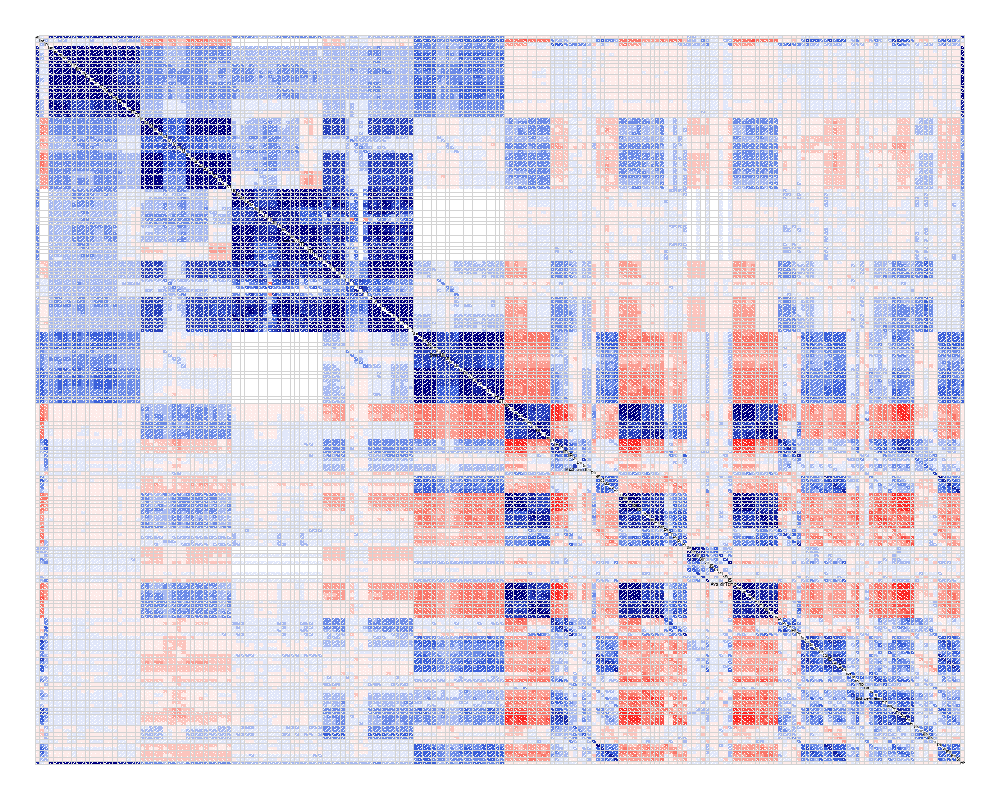

In [170]:
options(repr.plot.width = 15, repr.plot.height = 12 )
dfcormat <- cor(df_n[,numlst[1:204]], use = "pairwise.complete.obs",method = "spearman")
corrgram::corrgram(dfcormat)

### B.2. Analyitic investication of corelations

In [173]:
library("Hmisc")
res_oren <- rcorr(as.matrix(sapply(df,as.numeric)),type = "spearman")

Warning message in sqrt(npair - 2):
"NaNs produced"


In [362]:
flattenCorrMatrix <- function(cormat, pmat) 
    {
      ut <- upper.tri(cormat)
      data.frame(
                    row = rownames(cormat)[row(cormat)[ut]],
                    column = rownames(cormat)[col(cormat)[ut]],
                    cor  =(cormat)[ut],
                    p = pmat[ut]
                )
    }

In [175]:
CorrMatrix <- flattenCorrMatrix(res_oren$r, res_oren$P)
CorrMatrix

row,column,cor,p
<chr>,<chr>,<dbl>,<dbl>
BIDm,SIDn,0.082530045,0.000000e+00
BIDm,PrUs,0.022561146,2.375437e-02
SIDn,PrUs,0.167950443,0.000000e+00
BIDm,SbPrUs,0.020359852,4.130881e-02
SIDn,SbPrUs,0.206206259,0.000000e+00
PrUs,SbPrUs,0.552831794,0.000000e+00
BIDm,sqm,-0.003060354,7.564602e-01
SIDn,sqm,-0.025863146,8.757664e-03
PrUs,sqm,-0.115376998,0.000000e+00


In [176]:
FilterCorrMatrix <-  filter(CorrMatrix,(abs(cor)>0.7) & (p<0.05) & (column!="El_Nxt_Mnth_Avg_OC"))
FilterCorrMatrix

row,column,cor,p
<chr>,<chr>,<dbl>,<dbl>
sqm,El_Max_W1,0.7226773,0
sqm,El_Max_W2,0.7340156,0
El_Max_W1,El_Max_W2,0.9719035,0
sqm,El_Max_W3,0.7311142,0
El_Max_W1,El_Max_W3,0.9666031,0
El_Max_W2,El_Max_W3,0.9774163,0
sqm,El_Max_W4,0.7299398,0
El_Max_W1,El_Max_W4,0.9586687,0
El_Max_W2,El_Max_W4,0.9675733,0


In [177]:
FilterCorrMatrix2 <- filter(CorrMatrix,column=="El_Nxt_Mnth_Avg_OC" & (p < 0.05) & (abs(cor) > 0.1)) 

In [178]:
FilterCorrMatrix2$cor <- abs(FilterCorrMatrix2$cor)

In [179]:
FilterCorrMatrix2[order(FilterCorrMatrix2$cor,decreasing = TRUE),]

,row,column,cor,p
,<chr>,<chr>,<dbl>,<dbl>
18,El_AVG_W5,El_Nxt_Mnth_Avg_OC,0.9871414,0
17,El_AVG_W4,El_Nxt_Mnth_Avg_OC,0.9865767,0
16,El_AVG_W3,El_Nxt_Mnth_Avg_OC,0.9828140,0
15,El_AVG_W2,El_Nxt_Mnth_Avg_OC,0.9785589,0
14,El_AVG_W1,El_Nxt_Mnth_Avg_OC,0.9725624,0
7,El_Max_W4,El_Nxt_Mnth_Avg_OC,0.9613093,0
6,El_Max_W3,El_Nxt_Mnth_Avg_OC,0.9590925,0
8,El_Max_W5,El_Nxt_Mnth_Avg_OC,0.9581391,0
5,El_Max_W2,El_Nxt_Mnth_Avg_OC,0.9501169,0


In [180]:
write.csv(FilterCorrMatrix, file="BGP1_oren_filt_corr_over70-20052022.csv")




### B.3. Review the relationship between the categorical values

In [381]:
summary(df[,strlst])

                           BIDm             SIDn     
 Apr_Bobcat_assembly_Adam    :    1   Hog     :1824  
 Apr_Bobcat_assembly_Billy   :    1   Fox     :1644  
 Apr_Bobcat_assembly_Camilla :    1   Bull    :1476  
 Apr_Bobcat_assembly_Franklin:    1   Cockatoo:1404  
 Apr_Bobcat_education_Alissa :    1   Eagle   :1272  
 Apr_Bobcat_education_Angela :    1   Panther :1260  
 (Other)                     :10266   (Other) :1392  
                            PrUs                     SbPrUs    
 Education                    :3600   Office            :2532  
 Office                       :2544   College Classroom :1296  
 Lodging/residential          :1452   College Laboratory:1164  
 Entertainment/public assembly:1068   Dormitory         : 960  
 Public services              : 348   Research          : 348  
 (Other)                      :1032   (Other)           :3744  
 NA's                         : 228   NA's              : 228  
          Tmz      
 US/Central :3300  
 US/Eastern :469

In [383]:
summary(df[,strlst])
#table(df$BIDm )
table(df$SIDn)
table(df$PrUs)
table(df$SbPrUs)
table(df$Tmz)


                           BIDm             SIDn     
 Apr_Bobcat_assembly_Adam    :    1   Hog     :1824  
 Apr_Bobcat_assembly_Billy   :    1   Fox     :1644  
 Apr_Bobcat_assembly_Camilla :    1   Bull    :1476  
 Apr_Bobcat_assembly_Franklin:    1   Cockatoo:1404  
 Apr_Bobcat_education_Alissa :    1   Eagle   :1272  
 Apr_Bobcat_education_Angela :    1   Panther :1260  
 (Other)                     :10266   (Other) :1392  
                            PrUs                     SbPrUs    
 Education                    :3600   Office            :2532  
 Office                       :2544   College Classroom :1296  
 Lodging/residential          :1452   College Laboratory:1164  
 Entertainment/public assembly:1068   Dormitory         : 960  
 Public services              : 348   Research          : 348  
 (Other)                      :1032   (Other)           :3744  
 NA's                         : 228   NA's              : 228  
          Tmz      
 US/Central :3300  
 US/Eastern :469


  Bobcat     Bull Cockatoo     Crow    Eagle      Fox      Hog    Moose 
     408     1476     1404       60     1272     1644     1824      156 
 Panther  Peacock     Swan 
    1260      540      228 


                    Education Entertainment/public assembly 
                         3600                          1068 
       Food sales and service                    Healthcare 
                           60                           168 
          Lodging/residential      Manufacturing/industrial 
                         1452                            84 
                       Office                         Other 
                         2544                           132 
                      Parking               Public services 
                          228                           348 
            Religious worship                        Retail 
                           24                            84 
                     Services            Technology/science 
                          108                            36 
                      Utility             Warehouse/storage 
                           36                            72 


                   Academic              Animal Shelter 
                        228                          36 
                   Athletic              Athletic Field 
                        132                          36 
                 Auditorium                  Bar/Tavern 
                         48                          12 
              Central Plant                      Chapel 
                         12                          12 
                  Classroom           College Classroom 
                        324                        1296 
         College Laboratory            Community Center 
                       1164                          24 
          Conference Center                 Data Center 
                         48                          12 
                     Dining                   Dormitory 
                         24                         960 
             Fitness Center                      garage 
                        120   


 US/Central  US/Eastern US/Mountain  US/Pacific 
       3300        4692        2052         228 

In [384]:
# cat one agns the other...


table(df$SIDn,df$PrUs)
table(df$SIDn,df$SbPrUs)
table(df$SIDn,df$Tmz)
table(df$PrUs,df$SbPrUs)
table(df$PrUs,df$Tmz)
table(df$SbPrUs,df$Tmz)




          
           Education Entertainment/public assembly Food sales and service
  Bobcat         192                            48                      0
  Bull           756                           204                      0
  Cockatoo       516                           192                      0
  Crow            60                             0                      0
  Eagle          312                           132                     24
  Fox            756                           252                     24
  Hog            288                           132                     12
  Moose          156                             0                      0
  Panther        360                            60                      0
  Peacock        204                            48                      0
  Swan             0                             0                      0
          
           Healthcare Lodging/residential Manufacturing/industrial Office Other
  Bobcat  

          
           Academic Animal Shelter Athletic Athletic Field Auditorium
  Bobcat        168              0        0              0          0
  Bull            0              0        0             24         12
  Cockatoo        0              0        0              0          0
  Crow           60              0        0              0          0
  Eagle           0              0      132              0          0
  Fox             0              0        0             12         12
  Hog             0             36        0              0         24
  Moose           0              0        0              0          0
  Panther         0              0        0              0          0
  Peacock         0              0        0              0          0
  Swan            0              0        0              0          0
          
           Bar/Tavern Central Plant Chapel Classroom College Classroom
  Bobcat            0             0      0         0               

          
           US/Central US/Eastern US/Mountain US/Pacific
  Bobcat            0          0         408          0
  Bull           1476          0           0          0
  Cockatoo          0       1404           0          0
  Crow              0         60           0          0
  Eagle             0       1272           0          0
  Fox               0          0        1644          0
  Hog            1824          0           0          0
  Moose             0        156           0          0
  Panther           0       1260           0          0
  Peacock           0        540           0          0
  Swan              0          0           0        228

                               
                                Academic Animal Shelter Athletic Athletic Field
  Education                          228              0        0              0
  Entertainment/public assembly        0              0      132             36
  Food sales and service               0              0        0              0
  Healthcare                           0              0        0              0
  Lodging/residential                  0              0        0              0
  Manufacturing/industrial             0              0        0              0
  Office                               0              0        0              0
  Other                                0             36        0              0
  Parking                              0              0        0              0
  Public services                      0              0        0              0
  Religious worship                    0              0        0              0
  Retail

                               
                                US/Central US/Eastern US/Mountain US/Pacific
  Education                           1044       1608         948          0
  Entertainment/public assembly        336        432         300          0
  Food sales and service                12         24          24          0
  Healthcare                            36        120          12          0
  Lodging/residential                  360        912         180          0
  Manufacturing/industrial              60         24           0          0
  Office                              1080       1116         348          0
  Other                                 36         60          36          0
  Parking                               96         96          36          0
  Public services                       84        180          84          0
  Religious worship                      0         12          12          0
  Retail                                 0  

                             
                              US/Central US/Eastern US/Mountain US/Pacific
  Academic                             0         60         168          0
  Animal Shelter                      36          0           0          0
  Athletic                             0        132           0          0
  Athletic Field                      24          0          12          0
  Auditorium                          36          0          12          0
  Bar/Tavern                          12          0           0          0
  Central Plant                        0          0          12          0
  Chapel                               0          0          12          0
  Classroom                            0        324           0          0
  College Classroom                  516        432         348          0
  College Laboratory                 432        408         324          0
  Community Center                     0         24           0       

### B.3.1 Cramer's V - a correlation measure for categorial variables based on ChiSquare

##### Reference: <br>
Wikipedia - https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V <br>
R-Bloggers - https://www.r-bloggers.com/2011/06/example-8-39-calculating-cramers-v/

In [185]:
cv.test = function(x,y) 
{
  dd = chisq.test(x, y, correct=FALSE)
  CV = sqrt(dd$statistic /
    (length(x) * (min(length(unique(x)),length(unique(y))) - 1)))
 
  return(cbind('CramerV'=as.numeric(CV),'p-value'=dd$p.value))
}

In [186]:
cats_corr$CramerV

[1] 1.00000 0.21317 0.51482 1.00000 0.95744 0.98120 1.00000 0.95744 0.17487
[10] 0.40832

In [385]:
strlst

[1] "BIDm"   "SIDn"   "PrUs"   "SbPrUs" "Tmz"

In [387]:
cats_corr <- NULL

In [111]:
cats_corr <- rbind(cats_corr, cbind("SIDn", "BIDm",(cv.test(df$SIDn, df$BIDm))))
cats_corr <- rbind(cats_corr, cbind("SIDn", "PrUs",(cv.test(df$SIDn, df$PrUs))))
cats_corr <- rbind(cats_corr, cbind("SIDn", "SbPrUs",(cv.test(df$SIDn, df$SbPrUs))))
cats_corr <- rbind(cats_corr, cbind("SIDn", "Tmz",(cv.test(df$SIDn, df$Tmz))))
cats_corr <- rbind(cats_corr, cbind("BIDm", "PrUs",(cv.test(df$BIDm, df$PrUs))))
cats_corr <- rbind(cats_corr, cbind("BIDm", "SbPrUs",(cv.test(df$BIDm, df$SbPrUs))))
cats_corr <- rbind(cats_corr, cbind("BIDm", "Tmz",(cv.test(df$BIDm, df$Tmz))))
cats_corr <- rbind(cats_corr, cbind("PrUs", "SbPrUs",(cv.test(df$PrUs, df$SbPrUs))))
cats_corr <- rbind(cats_corr, cbind("PrUs", "Tmz",(cv.test(df$PrUs, df$Tmz))))
cats_corr <- rbind(cats_corr, cbind("SbPrUs", "Tmz",(cv.test(df$SbPrUs, df$Tmz))))

Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"


In [388]:
cats_corr <- rbind(cats_corr, cbind("SIDn", "PrUs",(cv.test(df$SIDn, df$PrUs))))
cats_corr <- rbind(cats_corr, cbind("SIDn", "SbPrUs",(cv.test(df$SIDn, df$SbPrUs))))
cats_corr <- rbind(cats_corr, cbind("SIDn", "Tmz",(cv.test(df$SIDn, df$Tmz))))
cats_corr <- rbind(cats_corr, cbind("PrUs", "SbPrUs",(cv.test(df$PrUs, df$SbPrUs))))
cats_corr <- rbind(cats_corr, cbind("PrUs", "Tmz",(cv.test(df$PrUs, df$Tmz))))
cats_corr <- rbind(cats_corr, cbind("SbPrUs", "Tmz",(cv.test(df$SbPrUs, df$Tmz))))

Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"
Warning message in chisq.test(x, y, correct = FALSE):
"Chi-squared approximation may be incorrect"


In [389]:
cats_corr <- data.frame(cats_corr)
row.names(cats_corr) <- NULL
cats_corr$CramerV <- round(as.numeric(cats_corr$CramerV),5)
cats_corr$p.value <- round(as.numeric(cats_corr$p.value),5)
cats_corr 

V1,V2,CramerV,p.value
<chr>,<chr>,<dbl>,<dbl>
SIDn,PrUs,0.21317,0
SIDn,SbPrUs,0.51482,0
SIDn,Tmz,1.00000,0
PrUs,SbPrUs,0.95744,0
PrUs,Tmz,0.17487,0
SbPrUs,Tmz,0.40832,0


### B.3.2 Cramer's V with rcompanion package

In [113]:
#install.packages("rcompanion")
library(rcompanion)

In [114]:
cramersV(df$SIDn, df$BIDm)

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 1

In [116]:
cramersV(df$SIDn, df$BIDm)
cramersV(df$SIDn, df$PrUs)
cramersV(df$SIDn, df$SbPrUs)
cramersV(df$SIDn, df$Tmz)
cramersV(df$BIDm, df$PrUs)
cramersV(df$BIDm, df$SbPrUs)
cramersV(df$BIDm, df$Tmz)
cramersV(df$PrUs, df$SbPrUs)
cramersV(df$PrUs, df$Tmz)
cramersV(df$SbPrUs, df$Tmz)


Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 1

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 0.2272418

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 0.5487956

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 1

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 1

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 1

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 1

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 1

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 0.2165894

Warning message in stats::chisq.test(...):
"Chi-squared approximation may be incorrect"


[1] 0.5057359

### ! Same cramers V results for bouth tests for categorial features

## ------------------------------------

## C. Outcome exploration

### C.1. Outcome density plot

Warning message:
"Removed 964 rows containing non-finite values (stat_density)."


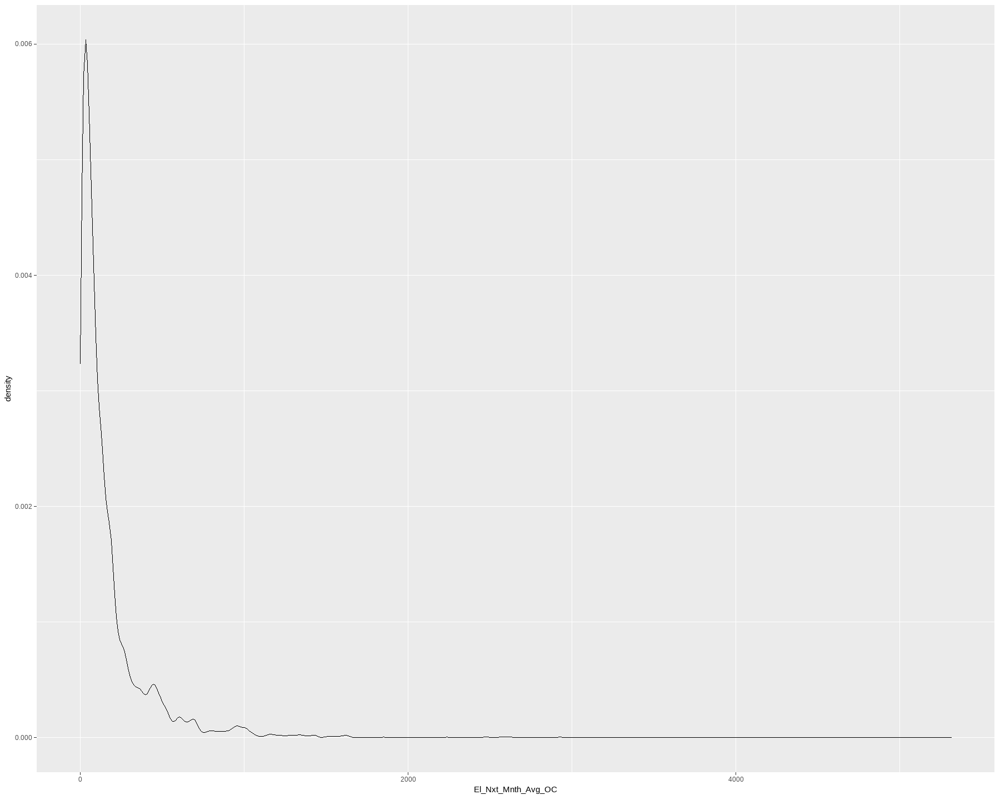

In [117]:
library(ggplot2)

ggplot(data=df,aes(x=El_Nxt_Mnth_Avg_OC)) +
 geom_density()


The resulting distribution is heavily biased to the left. So we can try to "normilize" it using a log transformation. As the minimum value is zero and the maximum 5314, we can add 1 to prevent generation of NA's. 

Warning message:
"Removed 964 rows containing non-finite values (stat_density)."


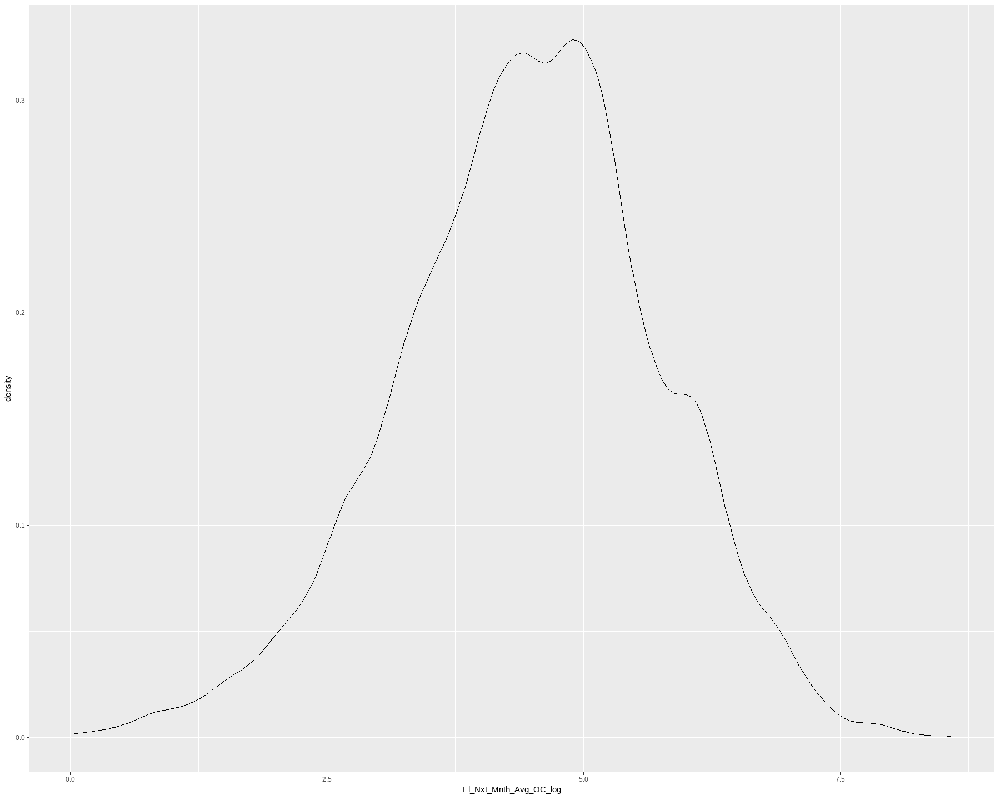

In [120]:
df$El_Nxt_Mnth_Avg_OC_log <- log(df$El_Nxt_Mnth_Avg_OC+1)
ggplot(data=df,aes(x=El_Nxt_Mnth_Avg_OC_log)) +
 geom_density()


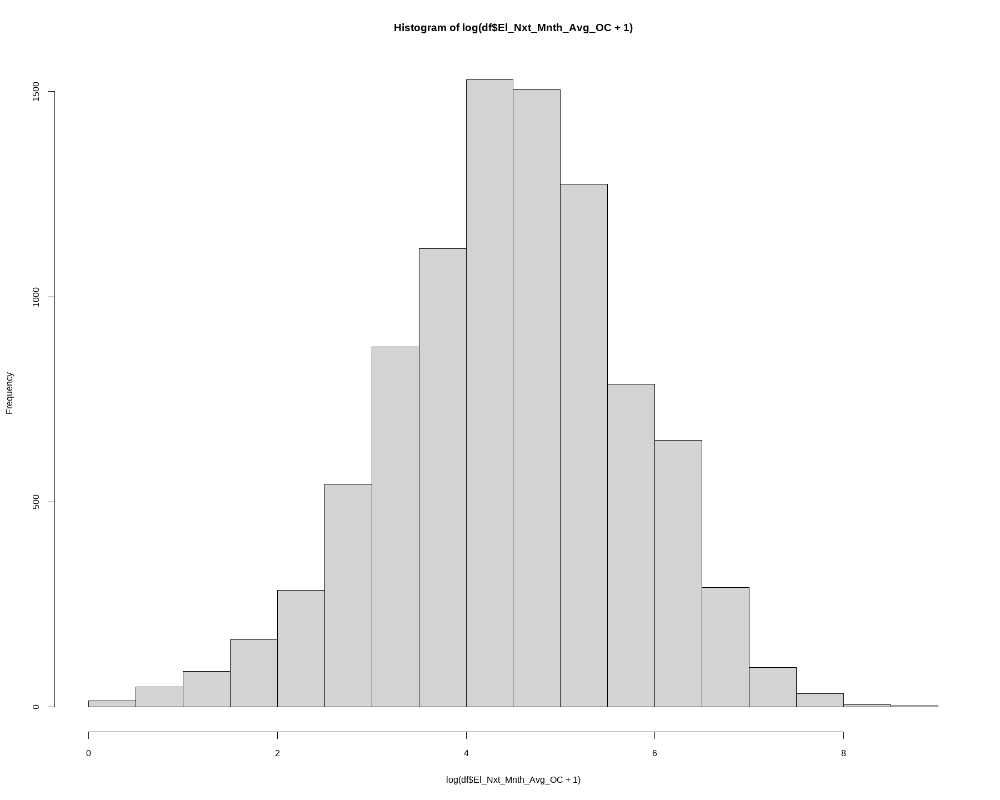

In [122]:
hist(log(df$El_Nxt_Mnth_Avg_OC+1))

## C.2. Box plot outcome - categories

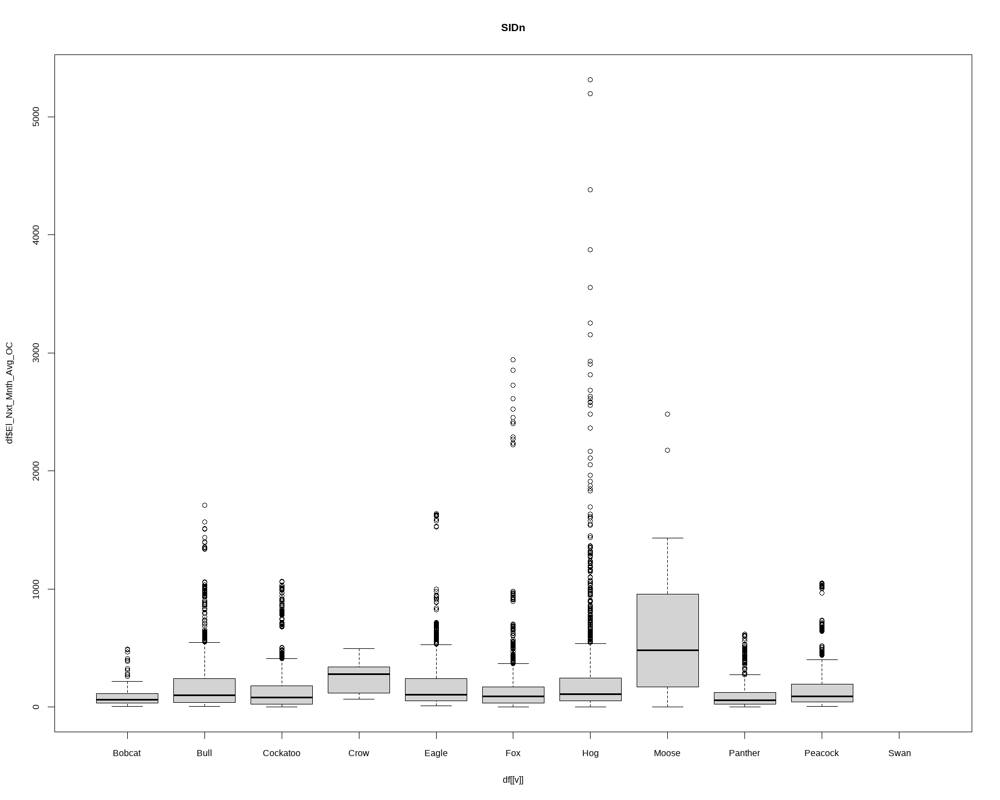

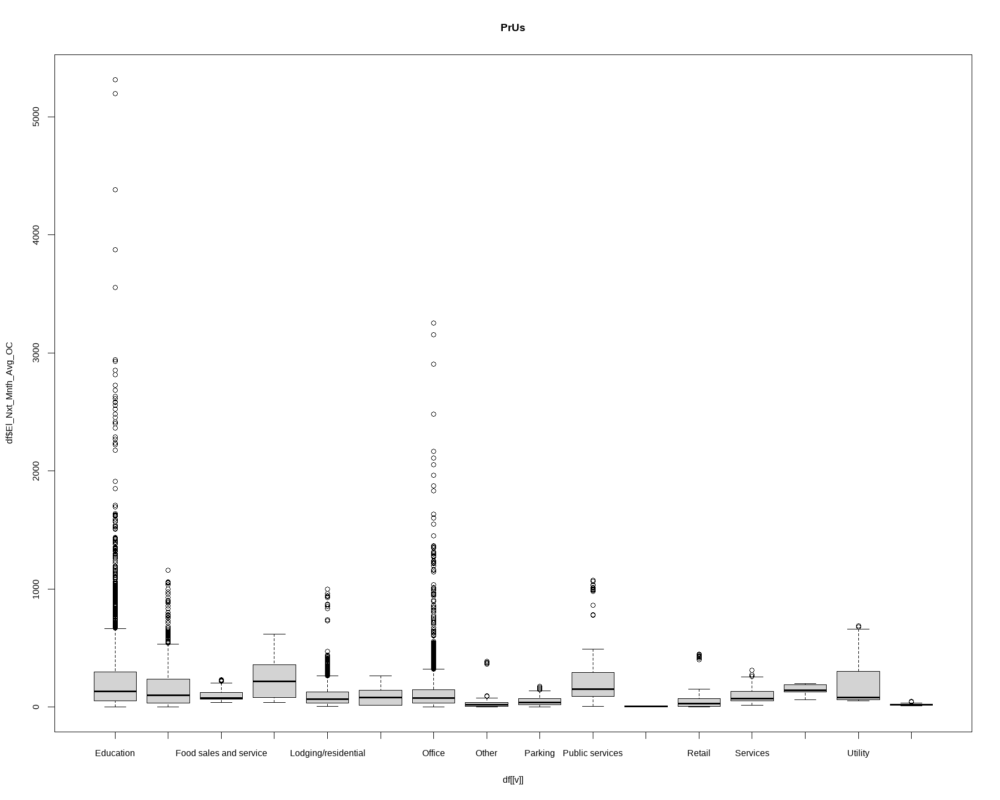

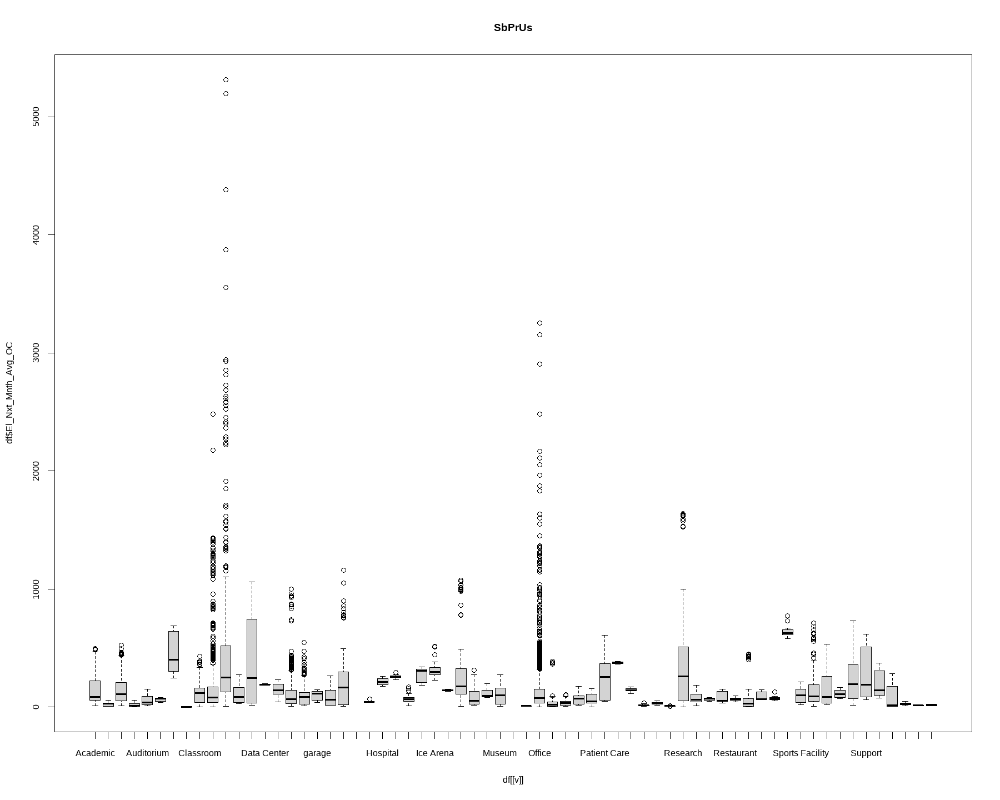

Warning message in min(x):
"no non-missing arguments to min; returning Inf"
Warning message in max(x):
"no non-missing arguments to max; returning -Inf"
Warning message in min(x):
"no non-missing arguments to min; returning Inf"
Warning message in max(x):
"no non-missing arguments to max; returning -Inf"


ERROR: Error in plot.window(...): need finite 'xlim' values


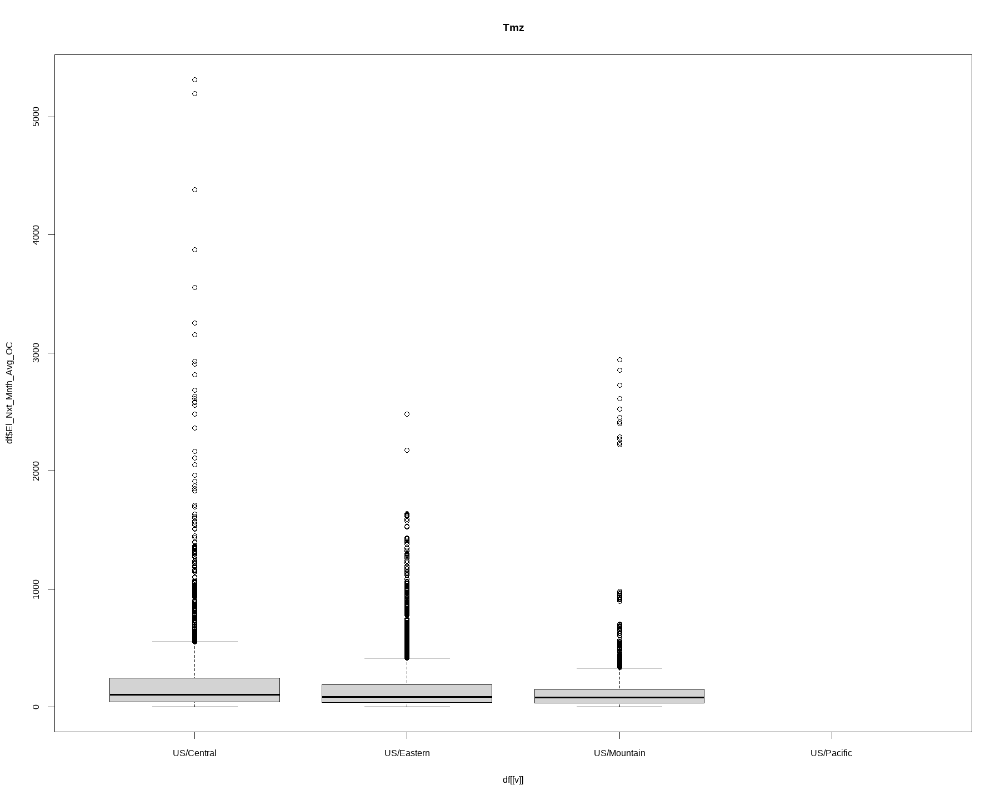

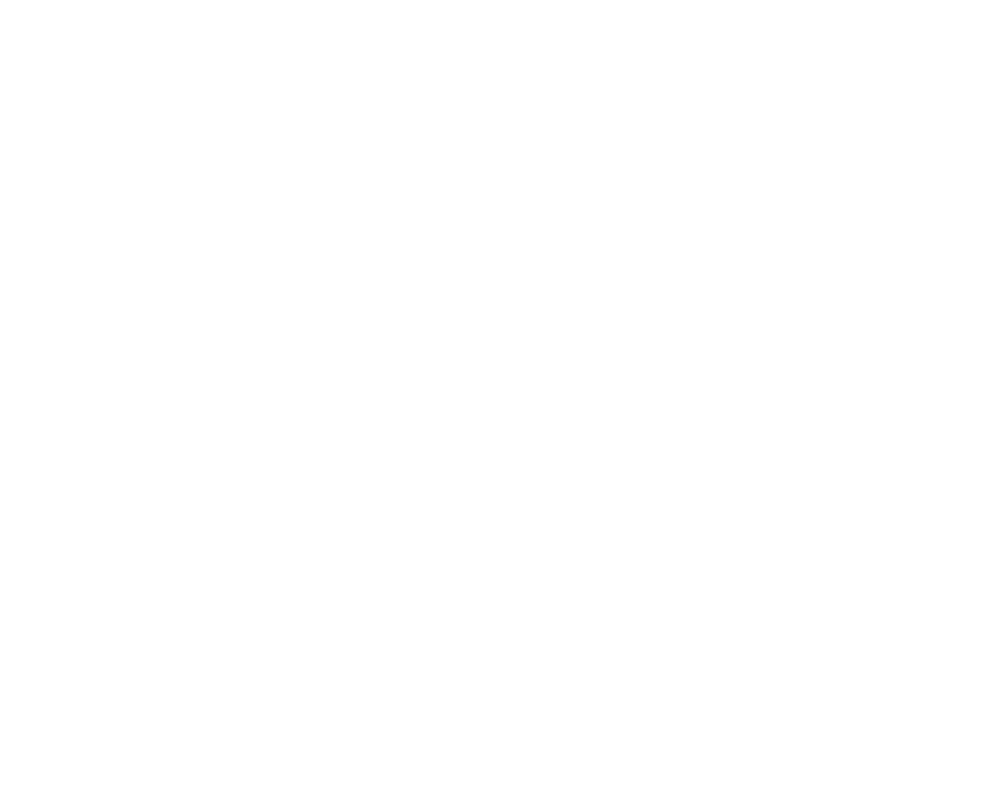

In [396]:
p <- NULL
par(mfrow=c(1,1))
for (v in c('SIDn','PrUs','SbPrUs','Tmz')) 
    {
    
            if(is.factor(df[[v]])==T)
            {
                boxplot(df$El_Nxt_Mnth_Avg_OC ~ df[[v]], main=v)
            }
    }
par(mfrow=c(1,1))
plot(p)


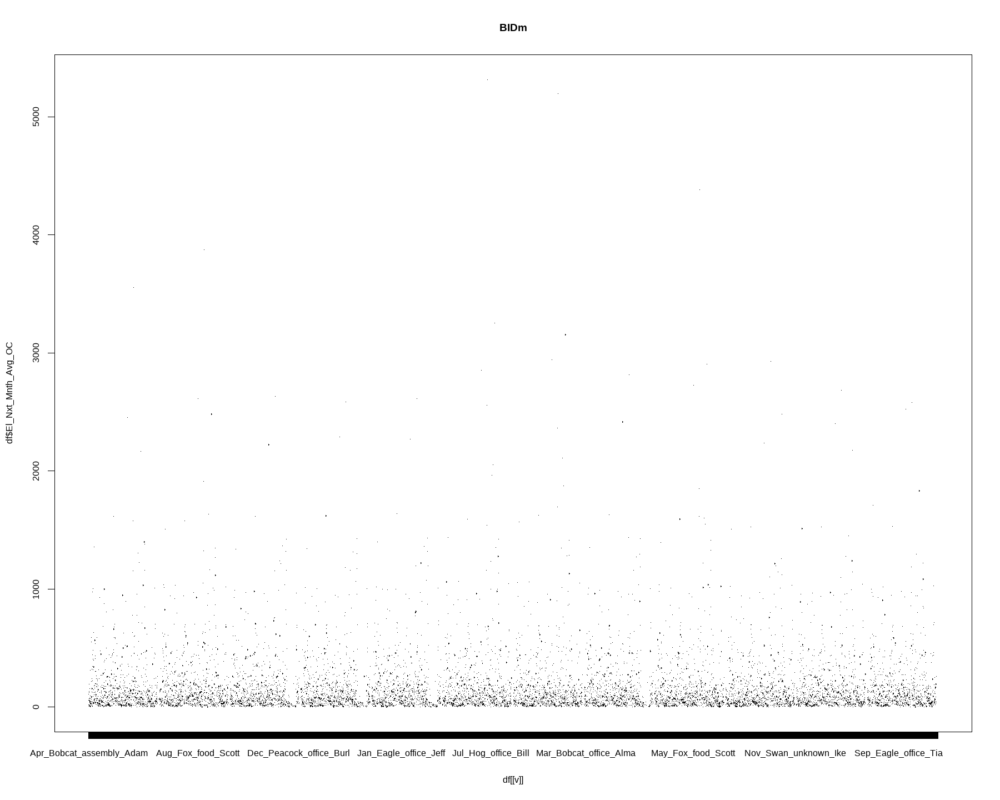

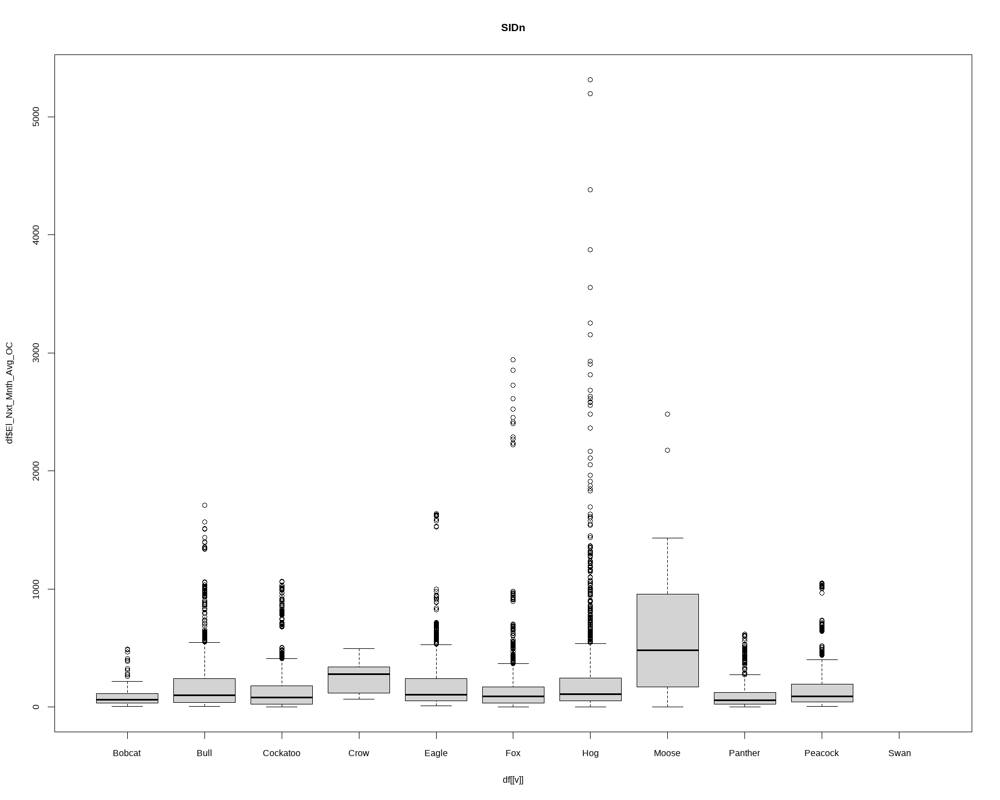

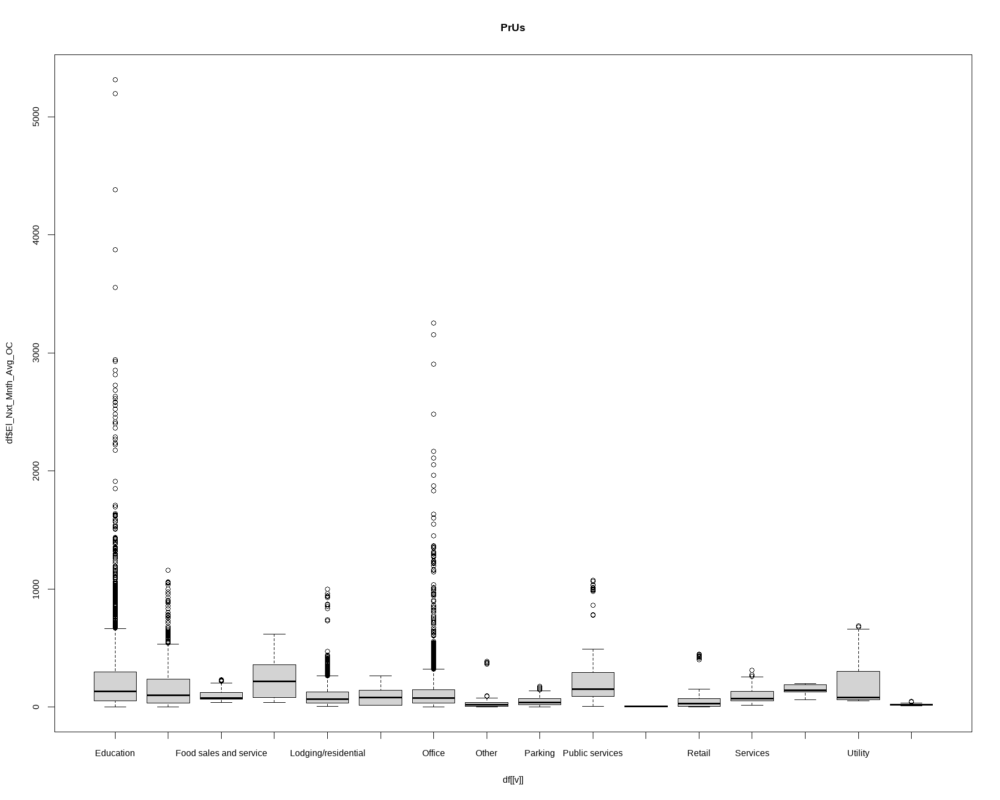

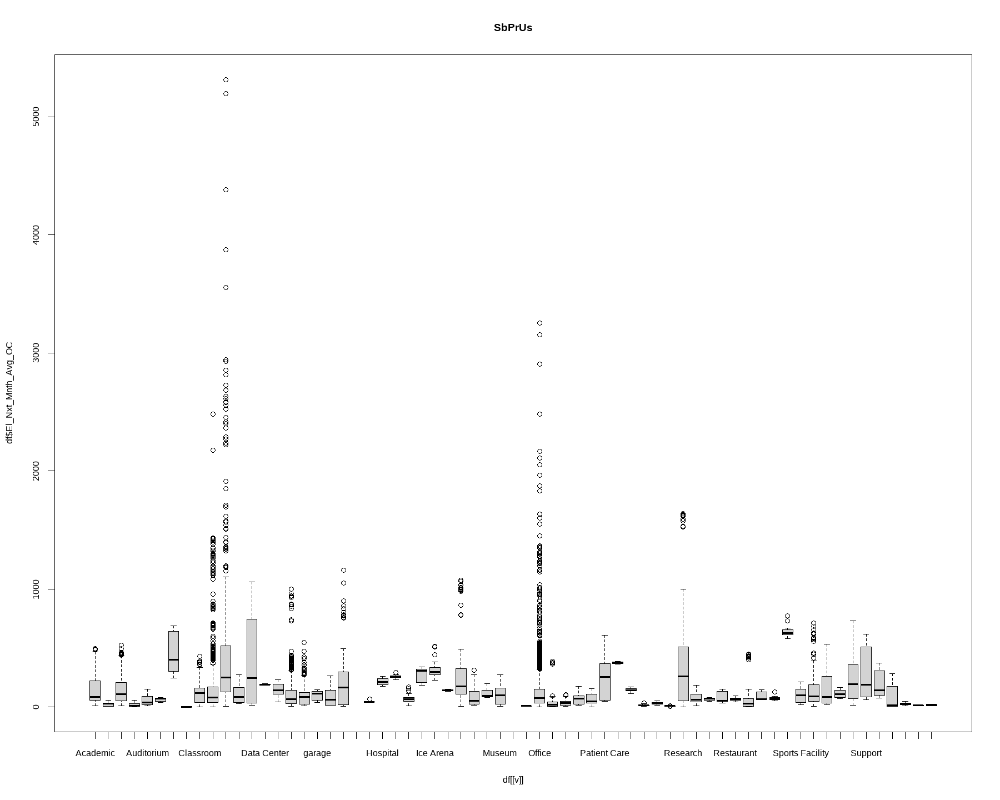

Warning message in min(x):
"no non-missing arguments to min; returning Inf"
Warning message in max(x):
"no non-missing arguments to max; returning -Inf"
Warning message in min(x):
"no non-missing arguments to min; returning Inf"
Warning message in max(x):
"no non-missing arguments to max; returning -Inf"


ERROR: Error in plot.window(...): need finite 'xlim' values


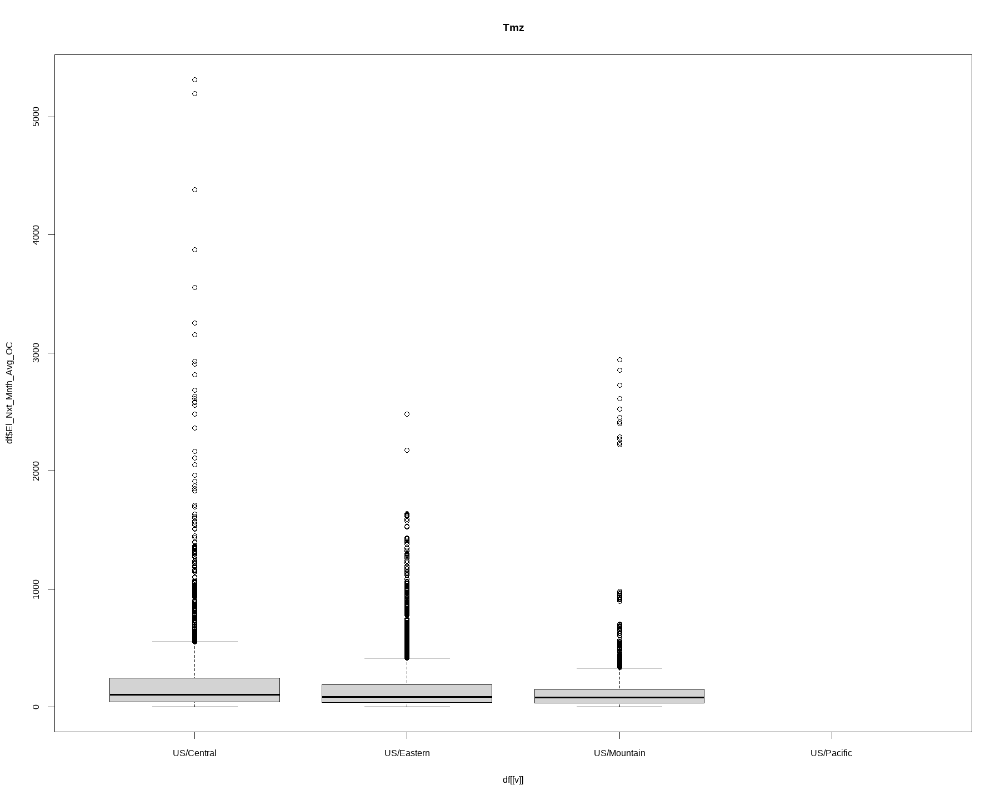

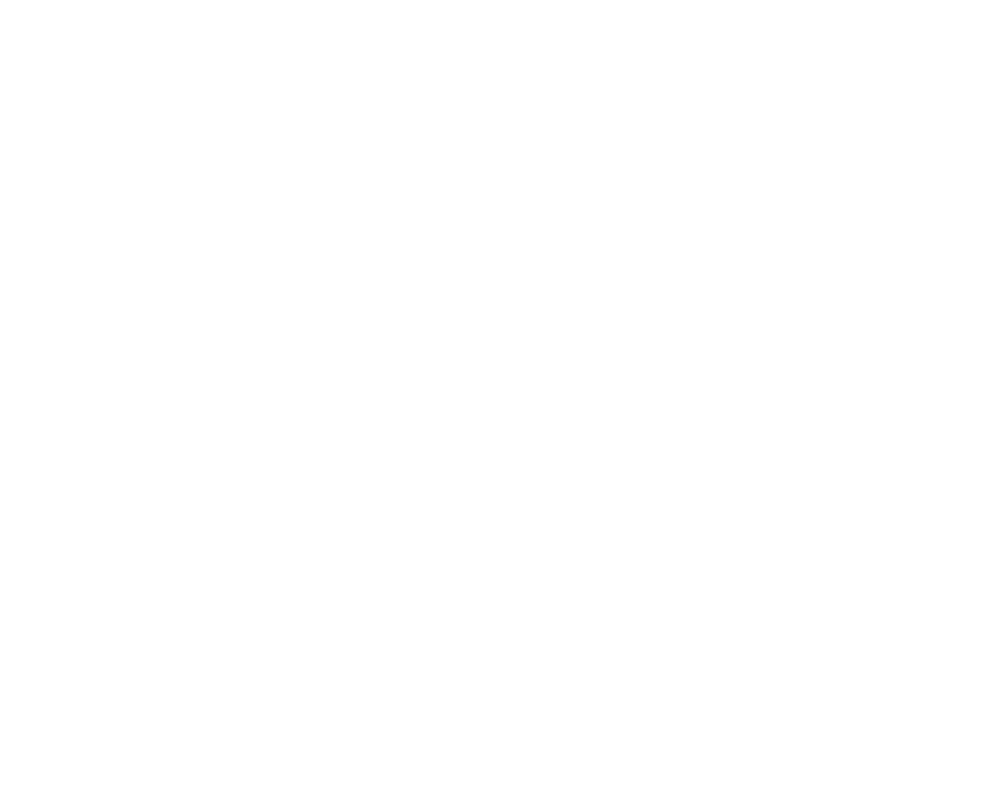

In [397]:
p <- NULL
par(mfrow=c(1,1))
for (v in names(df)) 
    {
    
             if(is.factor(df[[v]])==T) ## same as actual categorial names ...just checking to make sure
            {
                boxplot(df$El_Nxt_Mnth_Avg_OC ~ df[[v]], main=v)
            }
    }
par(mfrow=c(1,1))
plot(p)


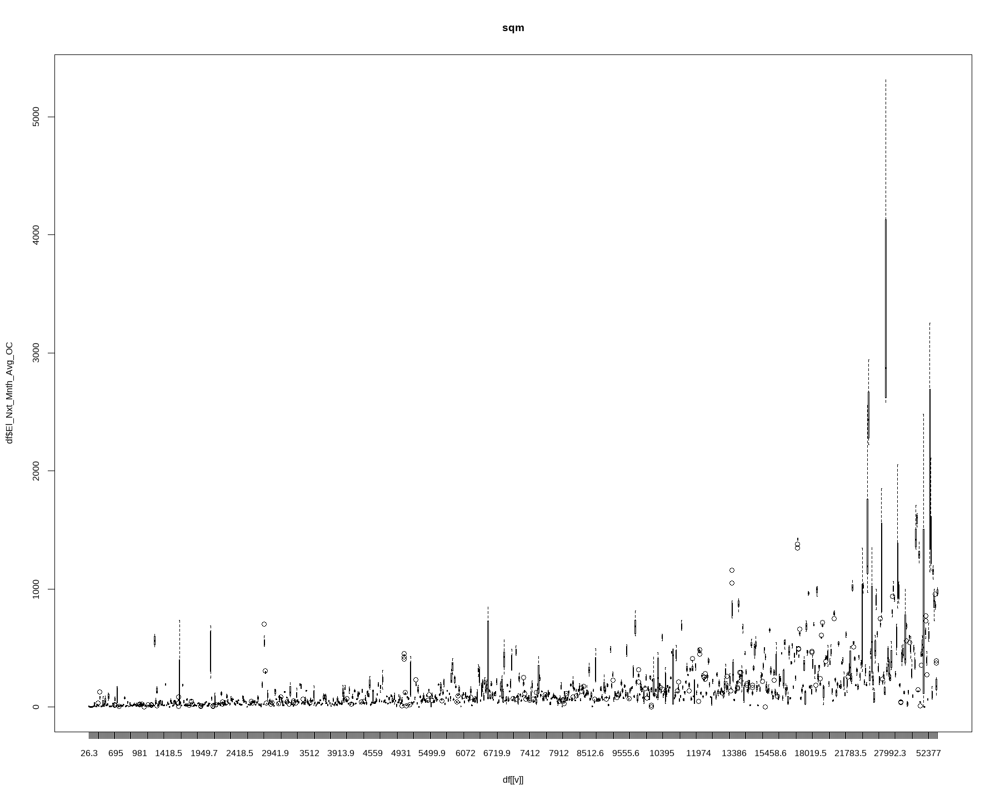

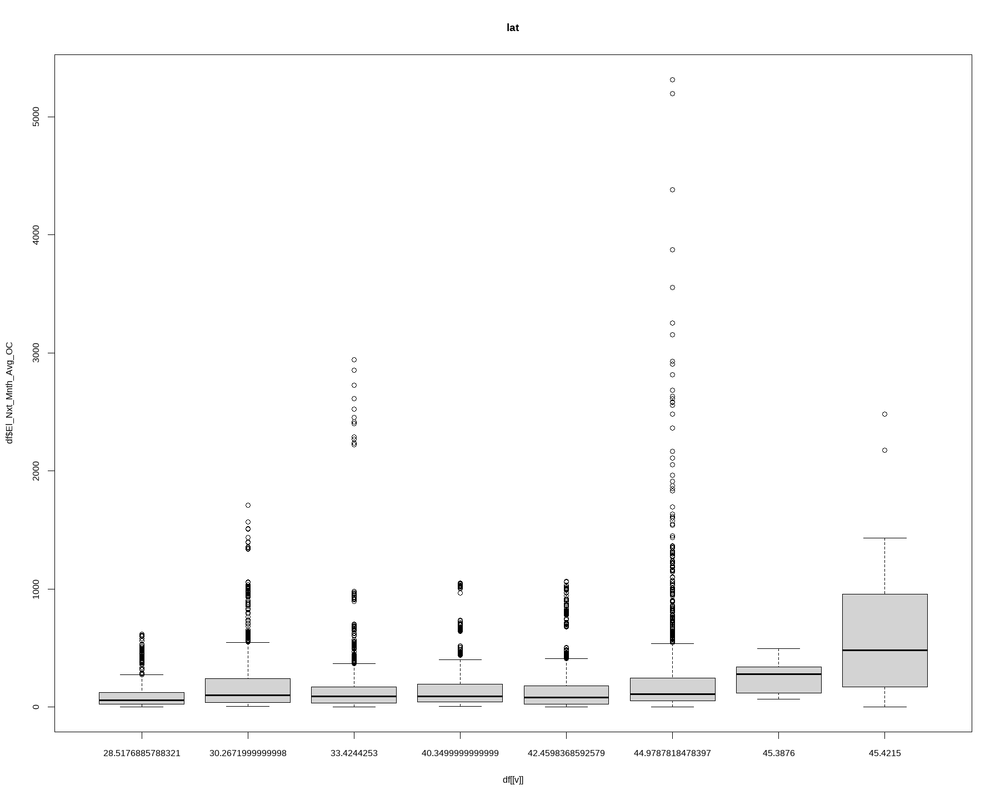

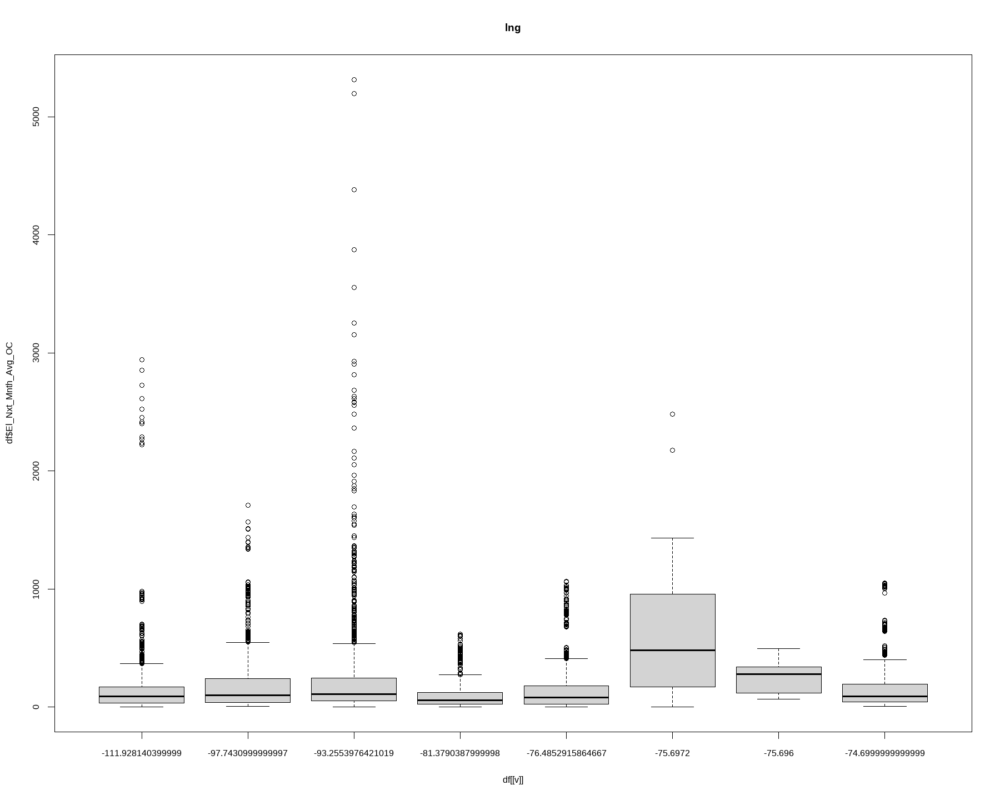

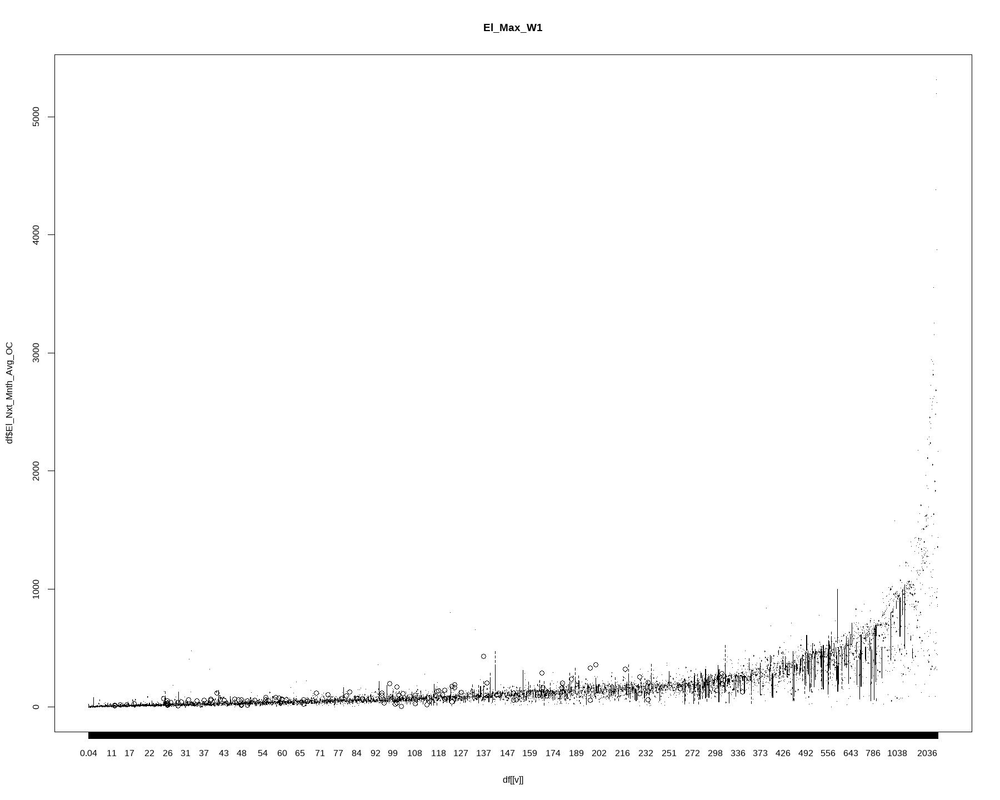

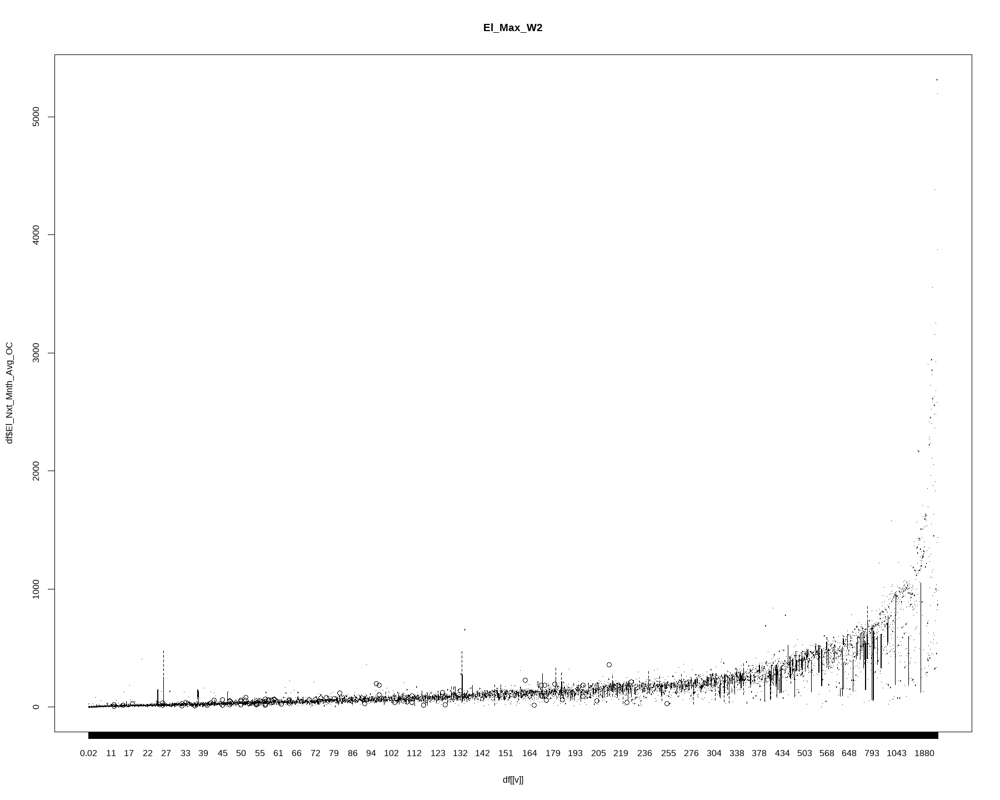

...

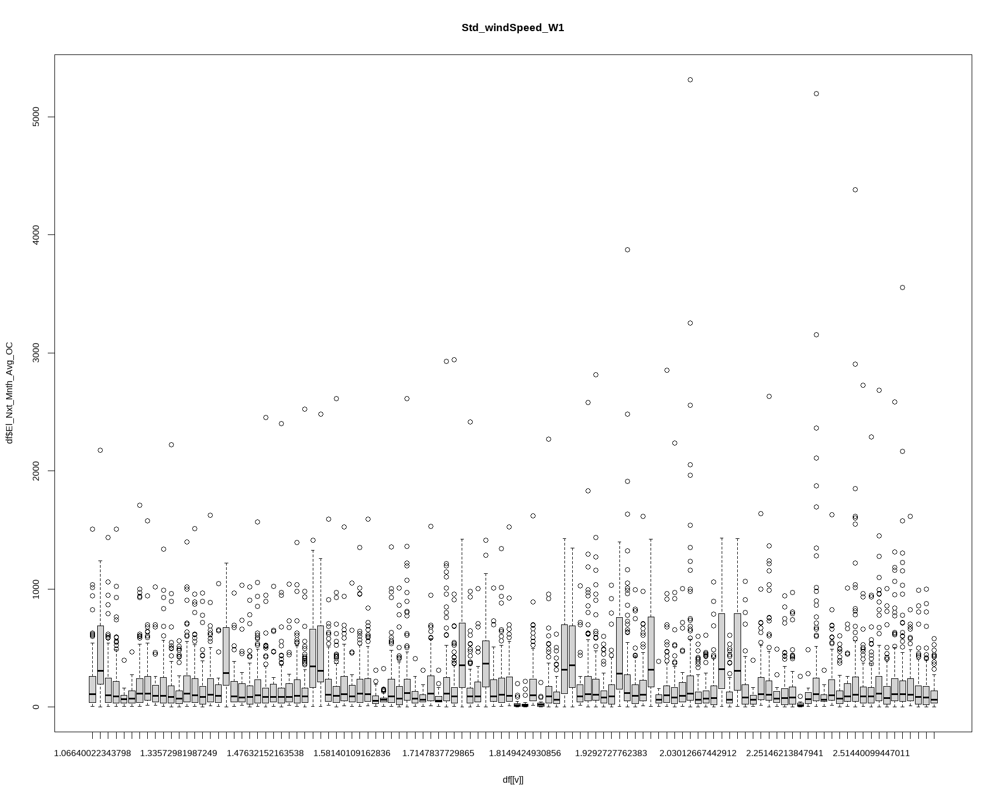

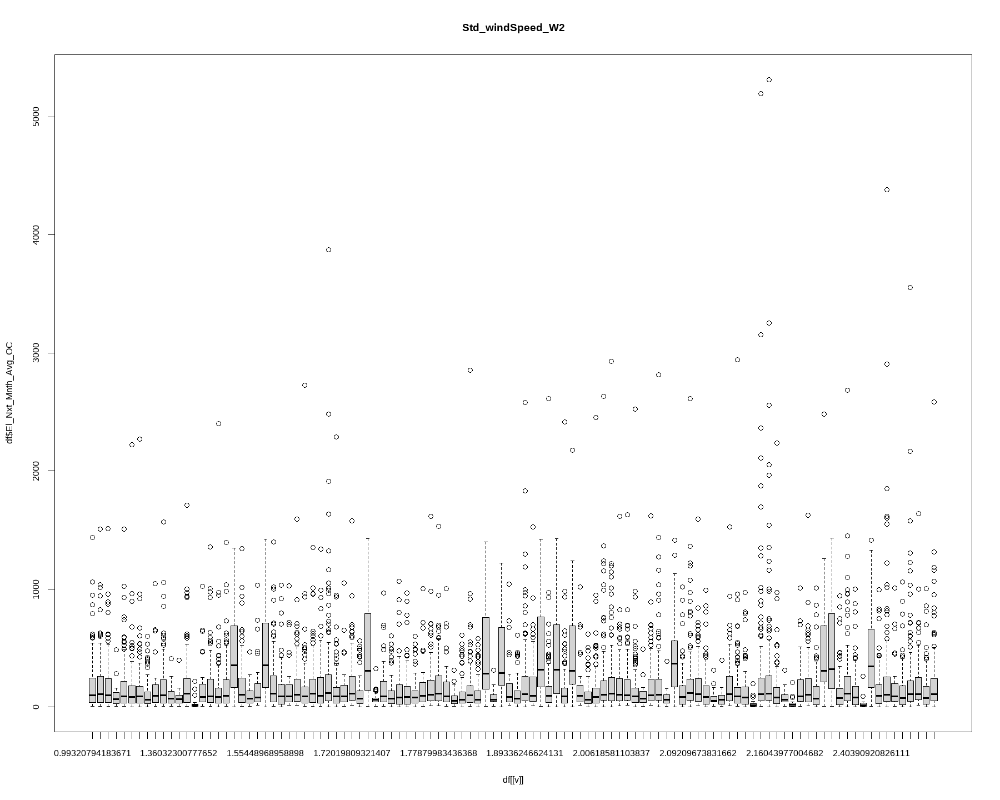

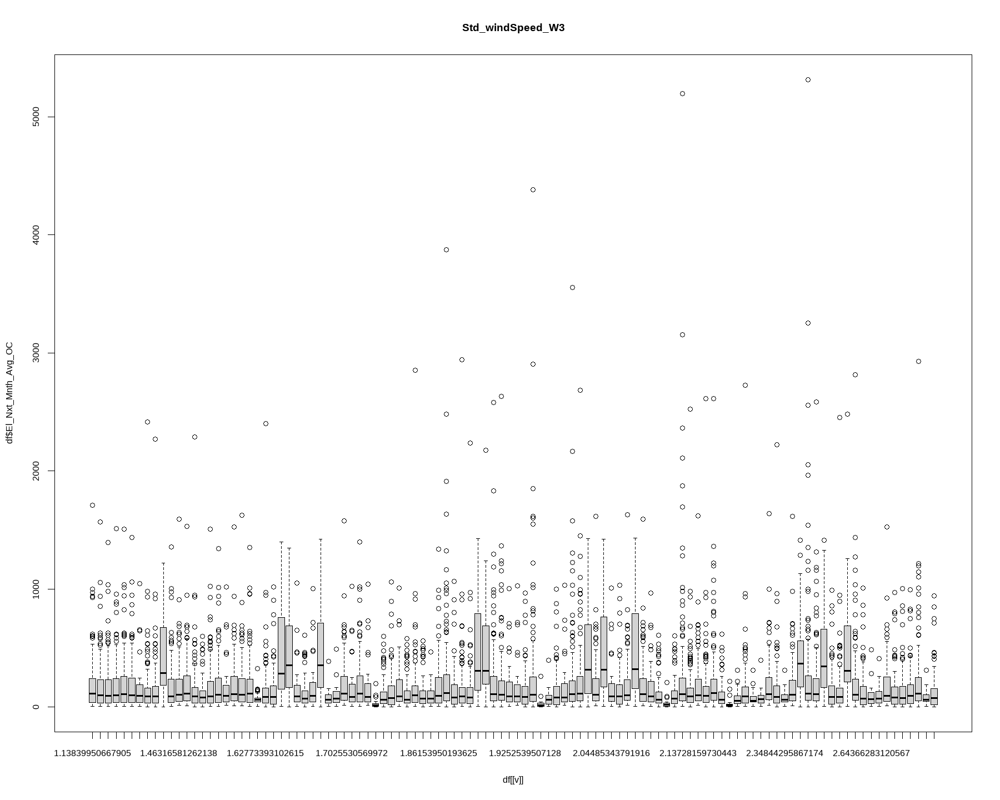

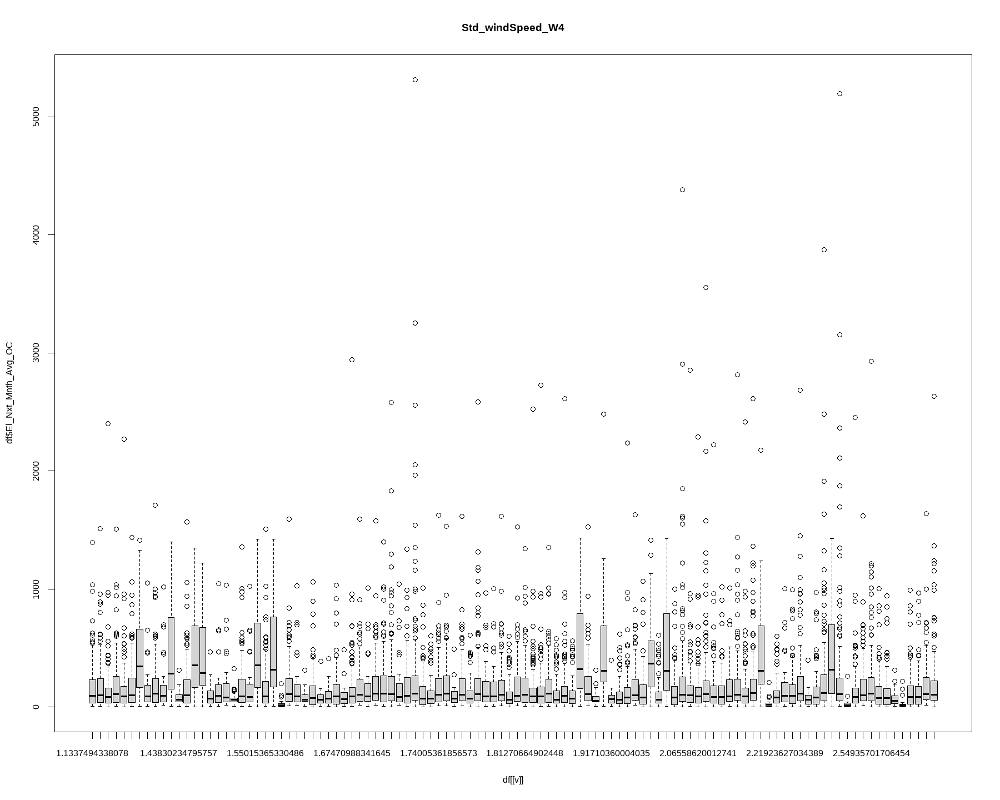

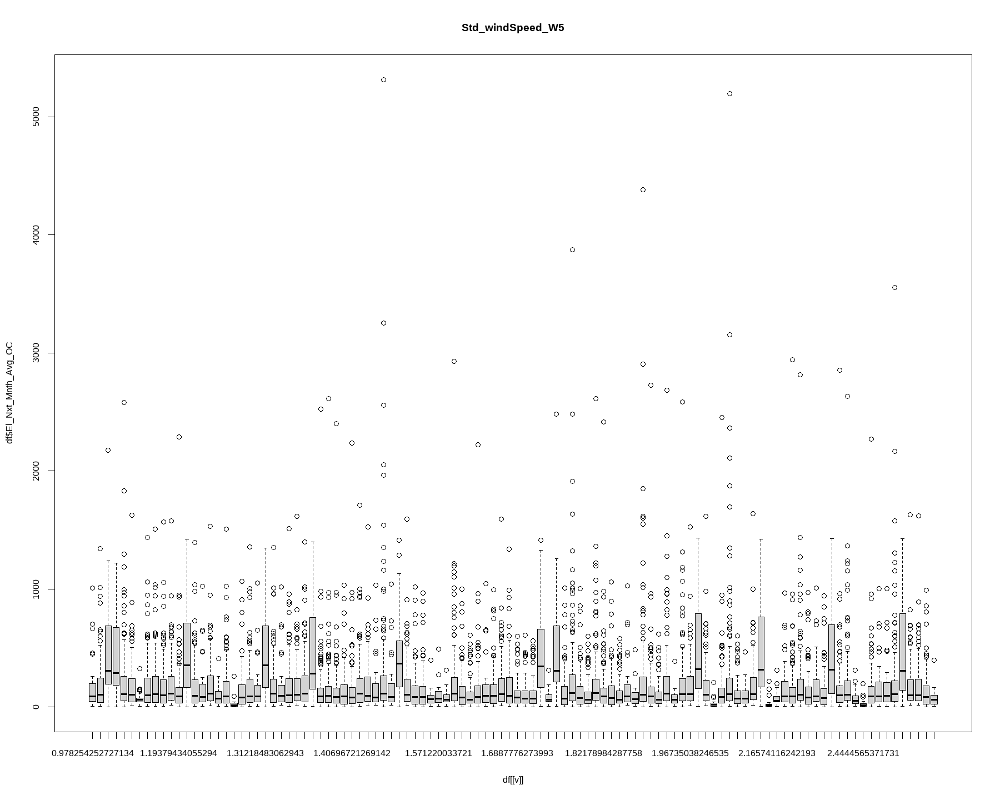

Warning message in min(x):
"no non-missing arguments to min; returning Inf"
Warning message in max(x):
"no non-missing arguments to max; returning -Inf"
Warning message in min(x):
"no non-missing arguments to min; returning Inf"
Warning message in max(x):
"no non-missing arguments to max; returning -Inf"


ERROR: Error in plot.window(...): need finite 'xlim' values


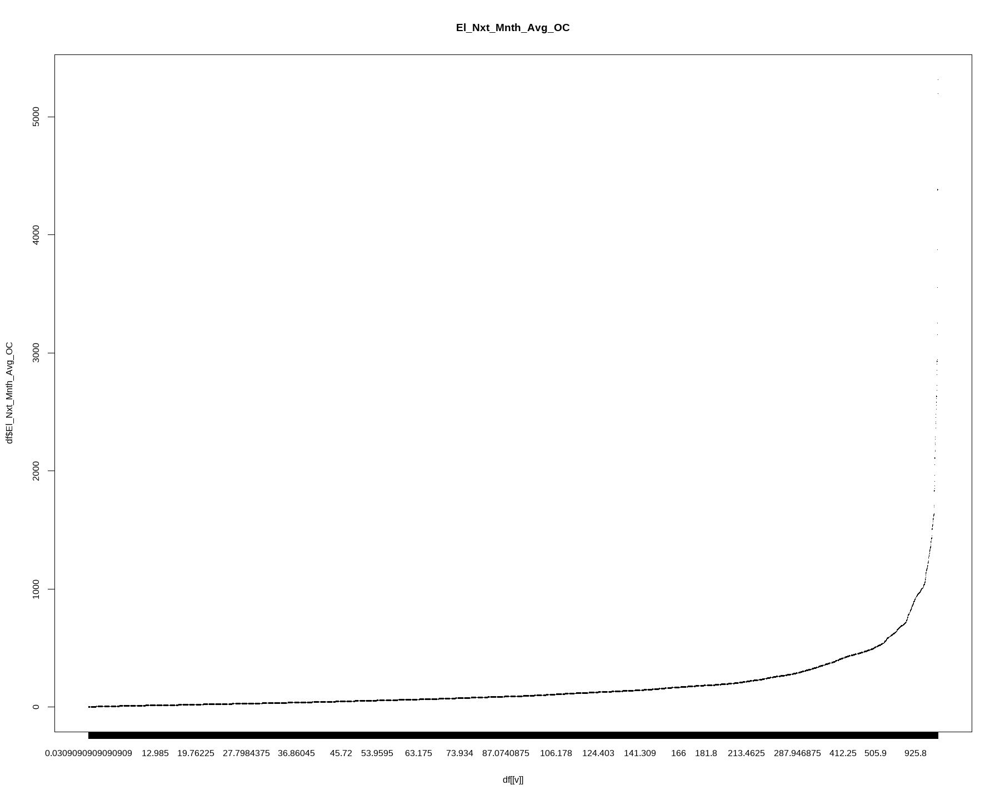

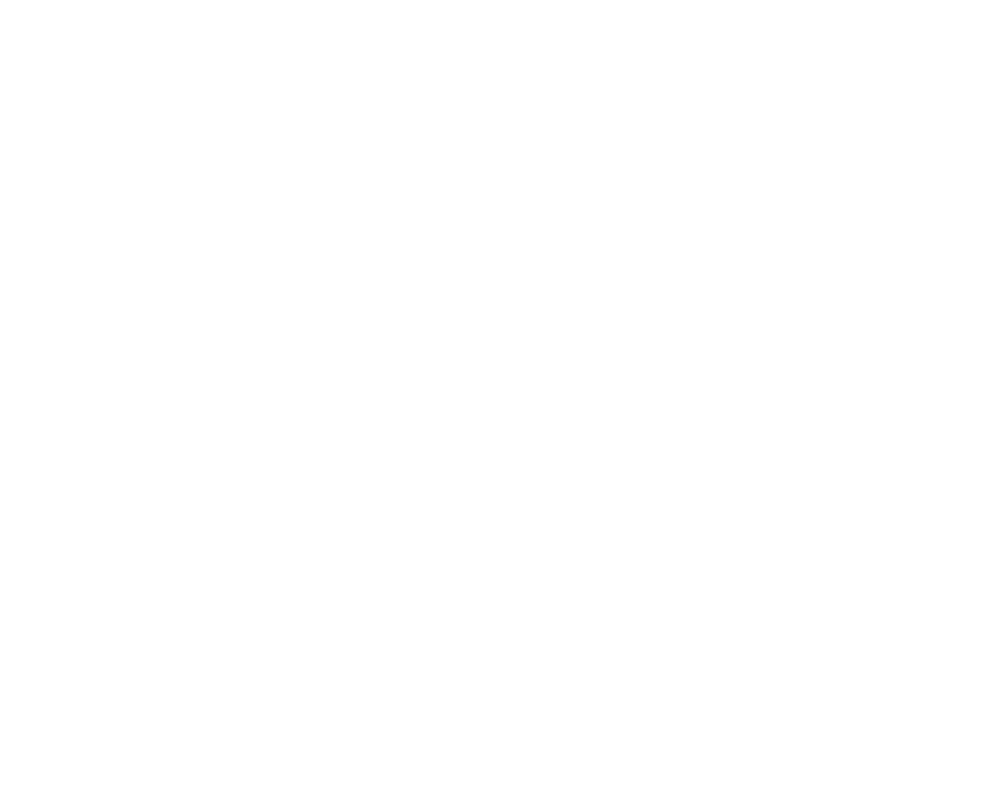

In [398]:
p <- NULL
par(mfrow=c(1,1))
for (v in names(df)) 
    {
    
             if(is.factor(df[[v]])==F)
            {
                boxplot(df$El_Nxt_Mnth_Avg_OC ~ df[[v]], main=v)
            }
    }
par(mfrow=c(1,1))
plot(p)
